### NEWW 


In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from PIL import Image
import pandas as pd
import numpy as np

# Path to the CUB dataset root directory
CUB_ROOT = './data/CUB_200_2011/CUB_200_2011'

# Define image transformations (resizing to 224x224 for CNN compatibility)
transform = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.ToTensor(),
])

# Custom Dataset class for loading images, attribute vectors, and label vectors
class CUBDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform

        # Load metadata
        self.images_df = pd.read_csv(os.path.join(root_dir, 'images.txt'), sep=' ', header=None, names=['image_id', 'image_path'])
        
        # Load attributes and handle lines with incorrect field counts
        attributes_path = os.path.join(root_dir, 'attributes/image_attribute_labels.txt')
        self.attributes_df = self.load_attributes(attributes_path)
        
        self.labels_df = pd.read_csv(os.path.join(root_dir, 'image_class_labels.txt'), sep=' ', header=None, names=['image_id', 'class_id'])
        
        # Process attributes into vectors
        self.attribute_vectors = self.process_attributes()
        
    def load_attributes(self, filepath):
        # Read the file line-by-line to filter rows with exactly 5 columns
        attributes_data = []
        with open(filepath, 'r') as file:
            for line in file:
                # Split by whitespace and check length
                row = line.split()
                if len(row) == 5:
                    attributes_data.append(row)
        
        # Convert the filtered list to a DataFrame
        return pd.DataFrame(attributes_data, columns=['image_id', 'attribute_id', 'is_present', 'certainty', 'time']).astype({
            'image_id': int, 'attribute_id': int, 'is_present': int, 'certainty': float, 'time': float
        })

    def process_attributes(self):
        # Initialize dictionary to store attribute vectors
        attribute_vectors = {}
        for image_id in self.images_df['image_id']:
            # Get attributes for this image, set as 1 if present, otherwise 0
            attributes = self.attributes_df[self.attributes_df['image_id'] == image_id]
            attribute_vector = torch.zeros(312)  # 312 attributes
            attribute_presents = attributes[attributes['is_present'] == 1]['attribute_id']
            attribute_presents = np.array([int(i) for i in attribute_presents])
            # print(attribute_presents)
            attribute_vector[attribute_presents - 1] = 1
            attribute_vectors[image_id] = attribute_vector
        return attribute_vectors
    
    def __len__(self):
        return len(self.images_df)
    
    def __getitem__(self, idx):
        # Get image path and load image
        image_path = os.path.join(self.root_dir, 'images', self.images_df.iloc[idx, 1])
        image = Image.open(image_path).convert('RGB')
        
        # Apply transformations
        if self.transform:
            image = self.transform(image)
        
        # Get attribute vector and label
        image_id = self.images_df.iloc[idx, 0]
        attribute_vector = self.attribute_vectors[image_id]
        label = self.labels_df[self.labels_df['image_id'] == image_id]['class_id'].values[0] - 1  # Zero-indexing class labels
        
        return image, attribute_vector, label

# Load full dataset
cub_dataset = CUBDataset(root_dir=CUB_ROOT, transform=transform)

# Split into train and test datasets
train_size = int(0.8 * len(cub_dataset))
test_size = len(cub_dataset) - train_size
train_dataset, test_dataset = random_split(cub_dataset, [train_size, test_size])

# DataLoaders with batch size 32
BATCH_SIZE = 32
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [3]:
LABEL_VECTOR_SIZE = 50

In [4]:
INCLUDE_LABELS = list(range(LABEL_VECTOR_SIZE)) 
cub_dataset = CUBDataset(root_dir=CUB_ROOT, transform=transform)

# Filter dataset to include only specific labels
filtered_indices = []
for idx in range(len(cub_dataset)):
    _, _, label = cub_dataset[idx]
    if label in INCLUDE_LABELS:
        filtered_indices.append(idx)

# Create a filtered dataset
filtered_dataset = torch.utils.data.Subset(cub_dataset, filtered_indices)

# Split filtered dataset into train and test datasets
train_size = int(0.8 * len(filtered_dataset))
test_size = len(filtered_dataset) - train_size
train_dataset, test_dataset = random_split(filtered_dataset, [train_size, test_size])

# DataLoaders with batch size 32
BATCH_SIZE = 32
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Print some stats
print(f"Total images in filtered dataset: {len(filtered_dataset)}")
print(f"Train dataset size: {len(train_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

Total images in filtered dataset: 2889
Train dataset size: 2311
Test dataset size: 578


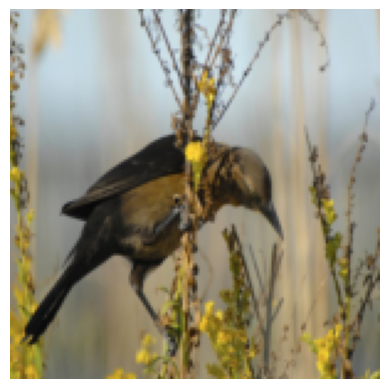

In [5]:
# Plot the first image
import matplotlib.pyplot as plt

# Get the first image and its attributes
image, attributes, label = train_dataset[20]

# Convert the image tensor to a NumPy array for plotting
image_np = image.permute(1, 2, 0).numpy()

# Plot the image
plt.imshow(image_np)
plt.axis('off')
plt.show()

In [ ]:
# linear 
# simple cnn
# complex cnn
# clip encoders with complex cnn
# resnet

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Encoder(nn.Module):
    def __init__(self, attribute_vector_size=312):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),  # [B, 32, 50, 50]
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=3, padding=1),  # [B, 64, 25, 25]
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3),

            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),  # [B, 128, 6, 6]
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),  # [B, 128, 3, 3]
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),  # [B, 128, 1, 1]
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3),

            nn.BatchNorm2d(128),

            nn.Flatten(), # [B, 128]
            nn.Linear(128 * 5 * 5, attribute_vector_size), # [B, 312]
        )

    def forward(self, x):
        x = self.encoder(x)
        # print(x.shape)
        return x




class AutoencoderWithClassifier(nn.Module):
    def __init__(self, attribute_vector_size=312, label_vector_size=LABEL_VECTOR_SIZE):
        super(AutoencoderWithClassifier, self).__init__()
        self.encoder = Encoder(attribute_vector_size=attribute_vector_size)
        self.classifier = nn.Linear(attribute_vector_size, label_vector_size)  # Simple Dense Layer

    def forward(self, x):
        attribute_vector = self.encoder(x)

        class_logits = self.classifier(attribute_vector)

        return attribute_vector, class_logits

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class LinearEncoder(nn.Module):
    def __init__(self, attribute_vector_size=312):
        super(LinearEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 150 * 150, 128 * 50 * 50), # [B, 312]
            nn.Linear(128 * 50 * 50, 128 * 10 * 10), # [B, 312]
            nn.Linear(128 * 10 * 10, attribute_vector_size), # [B, 312]
        )

    def forward(self, x):
        x = self.encoder(x)
        # print(x.shape)
        return x


class LinearDecoder(nn.Module):
    def __init__(self, attribute_vector_size=312):
        super(LinearDecoder, self).__init__()
        self.decoder = nn.Sequential(
            nn.Linear(attribute_vector_size, 128 * 5 * 5),  # [B, 128]
            nn.ReLU(),
            nn.Unflatten(1, (128, 5, 5)),  # [B, 128, 3, 3]

            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=1),  # [B, 64, 5, 5]
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=1),  # [B, 32, 7, 7]
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=1),  # [B, 16, 9, 9]
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3, kernel_size=3, stride=1),  # [B, 3, 11, 11]
            nn.Sigmoid()  # Normalize output to [0, 1]
        )

    def forward(self, x):
        return self.decoder(x)


class LinearAutoencoderWithClassifier(nn.Module):
    def __init__(self, attribute_vector_size=312, label_vector_size=LABEL_VECTOR_SIZE):
        super(AutoencoderWithClassifier, self).__init__()
        self.encoder = Encoder(attribute_vector_size=attribute_vector_size)
        self.decoder = Decoder(attribute_vector_size=attribute_vector_size)
        self.classifier = nn.Linear(attribute_vector_size, label_vector_size)  # Simple Dense Layer

    def forward(self, x):
        attribute_vector = self.encoder(x)

        class_logits = self.classifier(attribute_vector)

        return attribute_vector, class_logits

In [41]:
import torch
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from tqdm import tqdm

# Loss function
def calculate_losses(attribute_vector, class_logits, true_attribute, true_label, 
                     reconstruction_weight=0.1, classification_weight=0.3, attribute_weight=0.7):
 
    normalized_attribute_vector = torch.sigmoid(attribute_vector)
    attribute_loss = F.cross_entropy(normalized_attribute_vector, true_attribute)

    classification_loss = F.cross_entropy(class_logits, true_label)

    total_loss = classification_loss * classification_weight + attribute_loss * attribute_weight

    return total_loss, classification_loss, attribute_loss

# Training function
def train(model, train_loader, optimizer, device):
    model.train()
    total_loss = 0
    total_class_loss = 0
    total_attribute_loss = 0
    total_reconstruction_loss = 0
    
    for images, attribute_vectors, labels in tqdm(train_loader):
        images = images.to(device)
        attribute_vectors = attribute_vectors.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        
        # Forward pass
        predicted_attributes, class_logits = model(images)

        # Compute losses
        loss, class_loss, attr_loss = calculate_losses(predicted_attributes, class_logits, 
            attribute_vectors, labels
        )

        # Backpropagation
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_class_loss += class_loss.item()
        total_attribute_loss += attr_loss.item()

    avg_loss = total_loss / len(train_loader)
    avg_class_loss = total_class_loss / len(train_loader)
    avg_attribute_loss = total_attribute_loss / len(train_loader)

    print(f"Train Loss: {avg_loss:.4f}, Class Loss: {avg_class_loss:.4f}, Attribute Loss: {avg_attribute_loss:.4f}")
    return avg_loss

# Evaluation function
def evaluate(model, test_loader, device):
    model.eval()
    total_loss = 0
    total_class_loss = 0
    total_attribute_loss = 0

    with torch.no_grad():
        for images, attribute_vectors, labels in test_loader:
            images = images.to(device)
            attribute_vectors = attribute_vectors.to(device)
            labels = labels.to(device)

            # Forward pass
            predicted_attributes, class_logits = model(images)

            # Compute losses
            loss, class_loss, attr_loss = calculate_losses(predicted_attributes, class_logits, 
                attribute_vectors, labels
            )

            total_loss += loss.item()
            total_class_loss += class_loss.item()
            total_attribute_loss += attr_loss.item()

    avg_loss = total_loss / len(test_loader)
    avg_class_loss = total_class_loss / len(test_loader)
    avg_attribute_loss = total_attribute_loss / len(test_loader)

    print(f"Eval Loss: {avg_loss:.4f}, Class Loss: {avg_class_loss:.4f}, Attribute Loss: {avg_attribute_loss:.4f}")
    return avg_loss

# Run the training and evaluation loop
def run_training(model, train_loader, test_loader, num_epochs=30, lr=5e-4, device='cuda'):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    model.to(device)
                    
    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")
    
        # Training phase
        train_loss = train(model, train_loader, optimizer, device)
    
        # Evaluation phase
        eval_loss = evaluate(model, test_loader, device)
    
        print('-' * 50)

### Hyperparameter Training (to minimize loss)
Model Architecture Index, Learning Rate, classification_weight, attribute_weight, Classification Training Loss, Classification Train Accuracy, Attribute Training Loss, Classification Test Accuracy, Test Loss

- Step 1: Define 5-6 different model architectures and index them 
- Step 2: Train on different hyperparameters
- Step 3: Log them, and try to find trends in how attribute and class loss change with complexity of model 
- Step 4: Use the best 3 architectures/parameters for everything else

In [128]:
# Initialize model, train, and evaluate
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AutoencoderWithClassifier(attribute_vector_size=312, label_vector_size=LABEL_VECTOR_SIZE)

# Run training (assuming train_loader and test_loader are already defined)
run_training(model, train_loader, test_loader, num_epochs=25, lr=1e-3, device=device)

# Save the model 
torch.save(model.state_dict(), 'cub_dataset_training_weights.pth')


Epoch 1/25


100%|██████████| 21/21 [00:27<00:00,  1.32s/it]


Train Loss: 1.6259, Class Loss: 2.6610, Attribute Loss: 0.5907
Eval Loss: 1.6794, Class Loss: 2.6753, Attribute Loss: 0.6836
--------------------------------------------------
Epoch 2/25


100%|██████████| 21/21 [00:26<00:00,  1.28s/it]


Train Loss: 1.2662, Class Loss: 2.1043, Attribute Loss: 0.4280
Eval Loss: 1.6082, Class Loss: 2.5903, Attribute Loss: 0.6262
--------------------------------------------------
Epoch 3/25


100%|██████████| 21/21 [00:24<00:00,  1.18s/it]


Train Loss: 1.0514, Class Loss: 1.7654, Attribute Loss: 0.3374
Eval Loss: 1.4979, Class Loss: 2.4483, Attribute Loss: 0.5475
--------------------------------------------------
Epoch 4/25


100%|██████████| 21/21 [00:24<00:00,  1.18s/it]


Train Loss: 0.9149, Class Loss: 1.5162, Attribute Loss: 0.3136
Eval Loss: 1.2882, Class Loss: 2.2336, Attribute Loss: 0.3428
--------------------------------------------------
Epoch 5/25


100%|██████████| 21/21 [00:25<00:00,  1.23s/it]


Train Loss: 0.8466, Class Loss: 1.3843, Attribute Loss: 0.3090
Eval Loss: 1.3977, Class Loss: 2.4657, Attribute Loss: 0.3298
--------------------------------------------------
Epoch 6/25


100%|██████████| 21/21 [00:27<00:00,  1.31s/it]


Train Loss: 0.7241, Class Loss: 1.1332, Attribute Loss: 0.3149
Eval Loss: 1.4460, Class Loss: 2.5987, Attribute Loss: 0.2933
--------------------------------------------------
Epoch 7/25


100%|██████████| 21/21 [00:19<00:00,  1.05it/s]


Train Loss: 0.6201, Class Loss: 0.9464, Attribute Loss: 0.2939
Eval Loss: 1.6635, Class Loss: 2.9821, Attribute Loss: 0.3449
--------------------------------------------------
Epoch 8/25


100%|██████████| 21/21 [00:21<00:00,  1.04s/it]


Train Loss: 0.5349, Class Loss: 0.7752, Attribute Loss: 0.2946
Eval Loss: 1.8022, Class Loss: 3.2577, Attribute Loss: 0.3466
--------------------------------------------------
Epoch 9/25


100%|██████████| 21/21 [00:20<00:00,  1.05it/s]


Train Loss: 0.4570, Class Loss: 0.6310, Attribute Loss: 0.2829
Eval Loss: 1.4576, Class Loss: 2.5965, Attribute Loss: 0.3187
--------------------------------------------------
Epoch 10/25


100%|██████████| 21/21 [00:20<00:00,  1.01it/s]


Train Loss: 0.3694, Class Loss: 0.4603, Attribute Loss: 0.2785
Eval Loss: 1.2144, Class Loss: 2.1258, Attribute Loss: 0.3029
--------------------------------------------------
Epoch 11/25


100%|██████████| 21/21 [00:20<00:00,  1.01it/s]


Train Loss: 0.2980, Class Loss: 0.3284, Attribute Loss: 0.2676
Eval Loss: 1.1826, Class Loss: 2.1173, Attribute Loss: 0.2479
--------------------------------------------------
Epoch 12/25


100%|██████████| 21/21 [00:20<00:00,  1.05it/s]


Train Loss: 0.2559, Class Loss: 0.2503, Attribute Loss: 0.2615
Eval Loss: 1.2385, Class Loss: 2.2079, Attribute Loss: 0.2692
--------------------------------------------------
Epoch 13/25


100%|██████████| 21/21 [00:24<00:00,  1.18s/it]


Train Loss: 0.2271, Class Loss: 0.1986, Attribute Loss: 0.2557
Eval Loss: 1.2172, Class Loss: 2.1663, Attribute Loss: 0.2682
--------------------------------------------------
Epoch 14/25


100%|██████████| 21/21 [00:20<00:00,  1.02it/s]


Train Loss: 0.1894, Class Loss: 0.1271, Attribute Loss: 0.2518
Eval Loss: 1.5961, Class Loss: 2.9403, Attribute Loss: 0.2519
--------------------------------------------------
Epoch 15/25


100%|██████████| 21/21 [00:19<00:00,  1.06it/s]


Train Loss: 0.1634, Class Loss: 0.0877, Attribute Loss: 0.2391
Eval Loss: 1.3775, Class Loss: 2.5076, Attribute Loss: 0.2474
--------------------------------------------------
Epoch 16/25


100%|██████████| 21/21 [00:19<00:00,  1.09it/s]


Train Loss: 0.1494, Class Loss: 0.0626, Attribute Loss: 0.2362
Eval Loss: 1.3353, Class Loss: 2.4263, Attribute Loss: 0.2442
--------------------------------------------------
Epoch 17/25


100%|██████████| 21/21 [00:19<00:00,  1.07it/s]


Train Loss: 0.1398, Class Loss: 0.0514, Attribute Loss: 0.2283
Eval Loss: 1.1728, Class Loss: 2.1047, Attribute Loss: 0.2410
--------------------------------------------------
Epoch 18/25


100%|██████████| 21/21 [00:20<00:00,  1.04it/s]


Train Loss: 0.1253, Class Loss: 0.0264, Attribute Loss: 0.2243
Eval Loss: 1.2707, Class Loss: 2.3093, Attribute Loss: 0.2322
--------------------------------------------------
Epoch 19/25


100%|██████████| 21/21 [00:19<00:00,  1.06it/s]


Train Loss: 0.1193, Class Loss: 0.0215, Attribute Loss: 0.2170
Eval Loss: 1.1764, Class Loss: 2.1218, Attribute Loss: 0.2310
--------------------------------------------------
Epoch 20/25


100%|██████████| 21/21 [00:19<00:00,  1.07it/s]


Train Loss: 0.1142, Class Loss: 0.0159, Attribute Loss: 0.2126
Eval Loss: 1.1903, Class Loss: 2.1530, Attribute Loss: 0.2276
--------------------------------------------------
Epoch 21/25


100%|██████████| 21/21 [00:19<00:00,  1.07it/s]


Train Loss: 0.1103, Class Loss: 0.0126, Attribute Loss: 0.2081
Eval Loss: 1.1975, Class Loss: 2.1692, Attribute Loss: 0.2258
--------------------------------------------------
Epoch 22/25


100%|██████████| 21/21 [00:19<00:00,  1.09it/s]


Train Loss: 0.1074, Class Loss: 0.0108, Attribute Loss: 0.2039
Eval Loss: 1.2016, Class Loss: 2.1790, Attribute Loss: 0.2241
--------------------------------------------------
Epoch 23/25


100%|██████████| 21/21 [00:20<00:00,  1.04it/s]


Train Loss: 0.1052, Class Loss: 0.0105, Attribute Loss: 0.2000
Eval Loss: 1.1770, Class Loss: 2.1310, Attribute Loss: 0.2230
--------------------------------------------------
Epoch 24/25


100%|██████████| 21/21 [00:20<00:00,  1.05it/s]


Train Loss: 0.1029, Class Loss: 0.0094, Attribute Loss: 0.1965
Eval Loss: 1.1832, Class Loss: 2.1441, Attribute Loss: 0.2222
--------------------------------------------------
Epoch 25/25


100%|██████████| 21/21 [00:19<00:00,  1.08it/s]


Train Loss: 0.1013, Class Loss: 0.0090, Attribute Loss: 0.1935
Eval Loss: 1.2042, Class Loss: 2.1871, Attribute Loss: 0.2213
--------------------------------------------------


In [129]:
# check the model accuracy
def check_accuracy(model, dataloader, device):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, attributes, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            _, class_logits = model(images)
            _, predicted = torch.max(class_logits.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return correct / total

# Accuracy on training set
print(f'Accuracy on training set: {check_accuracy(model, train_loader, device) * 100:.2f}%')

test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               32, shuffle=False)

print(f'Accuracy on test set: {check_accuracy(model, test_loader, device) * 100:.2f}%')



Accuracy on training set: 100.00%
Accuracy on test set: 48.81%


In [130]:
# Load the model
model = AutoencoderWithClassifier(attribute_vector_size=312, label_vector_size=LABEL_VECTOR_SIZE)
model.load_state_dict(torch.load('cub_dataset_training_weights.pth'))
cifar_encoder = model.encoder

# Get the test images and their encodings
encodings = []
for images, _, _ in train_loader:
    encodings.append(cifar_encoder(images.to(device)).detach().cpu())
encodings = torch.cat(encodings)

# Get the top 10 images that activate each feature the most
top_images = []
for i in range(10):
    top_images.append(encodings[:, i].topk(10).indices)
top_images = torch.stack(top_images)

/tmp/ipykernel_1206/3804737517.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('cub_dataset_training_weights.pth'))


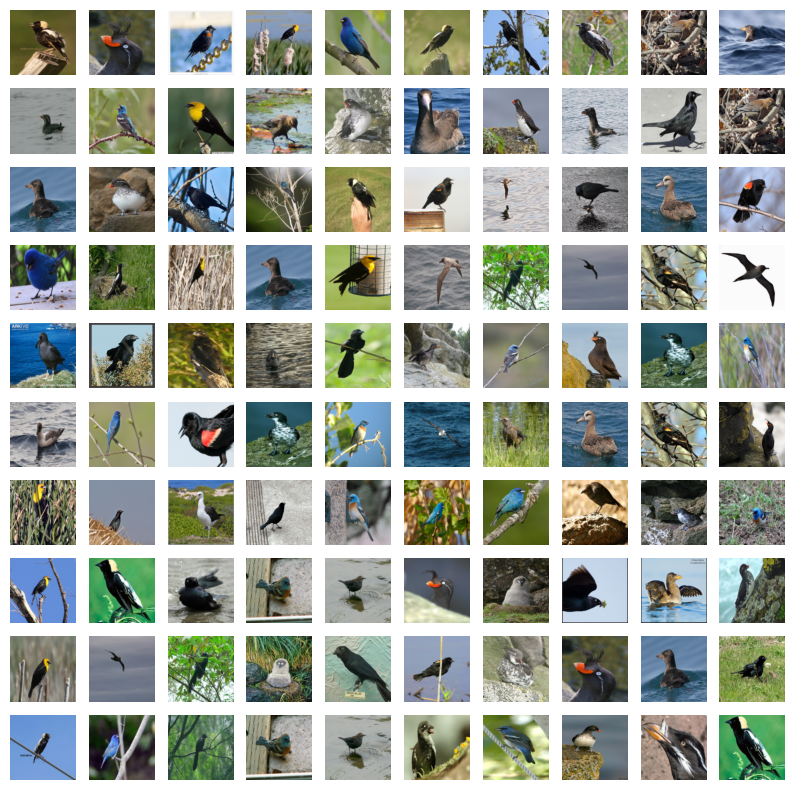

In [131]:
import numpy as np
fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(10, 10))
for i in range(10):
    for j in range(10):
        axes[i, j].imshow(np.transpose(train_dataset[top_images[i, j]][0], (1, 2, 0)))
        axes[i, j].axis('off')

plt.show() 

In [132]:
cub_all_class_names = pd.read_csv(os.path.join(CUB_ROOT, 'classes.txt'), sep=' ', header=None, names=['class_id', 'class_name'])

In [170]:
# cub_all_class_names is just the LABEL_VECTOR_SIZE classes
cub_class_names = cub_all_class_names.iloc[0:LABEL_VECTOR_SIZE]

In [358]:
!pip install scikit-image

Defaulting to user installation because normal site-packages is not writeable


In [353]:
%pip install "cvxpy[CBC,CVXOPT,GLOP,GLPK,GUROBI,MOSEK,PDLP,SCIP,XPRESS]"

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [376]:
import cvxpy as cp
import math
from scipy.optimize import linprog
import torch.nn.functional as F
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
import os
import csv
from PIL import Image, ImageDraw, ImageFont
import torch
import numpy as np
import random

classifier = model.classifier


In [7]:
# Function to compute SSIM between two images
def compute_ssim(image1, image2):
    image1_np = image1.detach().permute(1, 2, 0).cpu().numpy()
    image2_np = image2.detach().permute(1, 2, 0).cpu().numpy()
    return ssim(image1_np, image2_np, multichannel=True)

In [8]:

def compute_minimal_perturbation(weight_feature_new_class, weight_feature_all_classes, all_label_logits, new_label_logits, new_label):

    perturbation = cp.Variable()
    constraints = []

    for i in range(LABEL_VECTOR_SIZE):
        if i == new_label:
            continue
        weight_feature_other_class = weight_feature_all_classes[i]
        weight_feature_difference = weight_feature_new_class - weight_feature_other_class
        label_logits_difference = all_label_logits[i] - new_label_logits
        constraint = weight_feature_difference.detach() * perturbation >= label_logits_difference.detach() + 1e-6
        print(f"Constraint {i}: {weight_feature_difference.detach()} * p >= {label_logits_difference.detach()}")
        constraints.append(constraint)
    
    objective = cp.Minimize(perturbation ** 2)
    problem = cp.Problem(objective, constraints)
    problem.solve()

    if problem.status == cp.OPTIMAL:
        return perturbation.value, True
    else:
        return None, False

In [9]:
def construct_perturbed_image(model, perturbed_encoding, image, feature_index, new_label, direct_class_change_loss_weight, mse_weight):
    perturbed_image = image.clone().detach()
    perturbed_image.requires_grad_(True)
    initial_lr = 0.01
    optimizer = optim.Adam([perturbed_image], lr=initial_lr)
    max_iterations = 5000
    iteration = 0

    initial_loss = F.l1_loss(cifar_encoder(perturbed_image), perturbed_encoding)
    cosine_similarity_weight = 0
    mse_reconstruction_weight = 0
    experimentation_loss_weight = 0
    structural_similarity_loss_weight = 1

    correct_new_prediction_count = 5
    while max_iterations > 0:
        optimizer.zero_grad()

        obtained_encoding = cifar_encoder(perturbed_image)
        required_encoding = perturbed_encoding

        # Extract feature values
        obtained_feature_value = obtained_encoding[0, feature_index]
        required_feature_value = required_encoding[0, feature_index]

        # Compute class logits and required one-hot label
        class_logits_from_perturbed_image = classifier(obtained_encoding.view(1, -1))
        required_one_hot_label_vector = F.one_hot(torch.tensor([new_label]), num_classes=LABEL_VECTOR_SIZE).float()

        # Losses
        cosine_similarity_loss = F.cosine_embedding_loss(
            class_logits_from_perturbed_image,
            classifier(required_encoding.view(1, -1)),
            torch.tensor([1.0])
        )
        # mse_loss = F.mse_loss(obtained_encoding, required_encoding)
        mse_loss = F.binary_cross_entropy_with_logits(obtained_encoding, required_encoding)
        mse_reconstruction_loss = F.mse_loss(perturbed_image, image)
        direct_class_change_loss = F.mse_loss(class_logits_from_perturbed_image, required_one_hot_label_vector)

        experimentation_loss = (torch.norm(required_encoding - obtained_encoding).item() - abs(required_feature_value.item() - obtained_feature_value.item())) ** 2
        # Adjust win_size and specify channel_axis
        structural_similarity_loss = - ssim(
        perturbed_image.squeeze().detach().cpu().numpy(),
        image.squeeze().detach().cpu().numpy(), 
        data_range=1.0,  # Assuming images are normalized between 0 and 1
        channel_axis=0  # Adjust this if your channel is on a different axis
    )


        # Combined loss
        target_loss = (
            mse_weight * mse_loss +
            cosine_similarity_weight * cosine_similarity_loss +
            mse_reconstruction_weight * mse_reconstruction_loss + 
            direct_class_change_loss_weight * direct_class_change_loss + 
            experimentation_loss_weight * experimentation_loss
        )

        # Backprop and optimize
        target_loss.backward()
        optimizer.step()
        perturbed_image.requires_grad_(True)  # Ensure grad tracking

        # Find the class prediction of perturbed image
        class_logits = classifier(cifar_encoder(perturbed_image).view(1, -1))
        _, predicted_label = torch.max(class_logits, 1)
        if predicted_label.item() == new_label:
            if correct_new_prediction_count == 0:
                break
            else:
                correct_new_prediction_count -= 1

        # Logging
        if iteration % 800 == 0:
            print(f"Iteration {iteration}, Loss = {target_loss.item()}, Feature Value Difference = {required_feature_value.item() - obtained_feature_value.item()}")
            print(f"Absolute Feature Vector Difference = {torch.norm(required_encoding - obtained_encoding).item()}")
            print(f" Required feature value = {required_feature_value.item()}, Obtained feature value = {obtained_feature_value.item()}")
            # Print each component of the loss (whose weight is not 0)
            for loss_name, loss_value in zip(
                ['MSE Loss', 'Cosine Similarity Loss', 'MSE Reconstruction Loss', 'Direct Class Change Loss', 'Experimentation Loss', 'Structural Similarity Loss'],
                [mse_loss, cosine_similarity_loss, mse_reconstruction_loss, direct_class_change_loss, experimentation_loss, structural_similarity_loss]
            ):
                print(f"{loss_name} = {loss_value}")
            # print(f"Required Encoding = {required_encoding}")
            # print(f"Obtained Encoding = {obtained_encoding}")
    
        iteration += 1
        max_iterations -= 1

    # print(f"Target Loss = {target_loss.item()}")
    # print(f"Perturved Image Shape = {perturbed_image.shape}")
    # torch.norm(perturbed_image - image) 
    return perturbed_image, mse_loss.item(), cosine_similarity_loss.item(), mse_reconstruction_loss.item()

In [10]:
# Read attribute names
def get_attribute_names(file_path):
    attribute_names = []
    with open(file_path, 'r') as f:
        for line in f:
            _, attribute_name = line.strip().split(' ', 1)
            attribute_names.append(attribute_name)
    return attribute_names

In [ ]:
for number_of_times in range(15):
    image_number = random.randint(0, len(train_dataset))
    image, _, _ = train_dataset[image_number]
    image = image.unsqueeze(0).to(device)

    encoding = cifar_encoder(image).detach()

    # Find the class of the image
    # Get the weights of just the first layer of the classifier
    classifier = model.classifier
    classifier_dense_layer = classifier
    classifier_weights = classifier.weight  # [10, 64 * 4 * 4]

    class_logits = classifier_dense_layer(encoding)
    # print(class_logits)
    class_prediction = torch.softmax(class_logits, dim=1).argmax()
    # print(class_prediction.item())
    print(f"Prediction of the Image: {class_prediction.item()} - Class Name : {cub_all_class_names.iloc[class_prediction.item(), 1]}, Actual Class: {train_dataset[image_number][2]} - {cub_all_class_names.iloc[train_dataset[image_number][2], 1]}")


    # Choose another label that is not the class of the image
    new_label = random.randint(0, 9)
    while new_label == class_prediction:
        new_label = random.randint(0, 9)
    print(f"New Label: {new_label} - {cub_all_class_names.iloc[new_label, 1]}")
    # Now, choose a random image from the test set.
    # Pass it through the encoder and get the encoding.
    # Pass the encoding through the classifier and get the output.
    # Show the image, the reconstruction, and the output of the classifier.
    # Now, choose any 5 features out of the 512.
    # Compute the activation map of each feature for the image.
    # Show the activation map of each feature.

    # Choose a random image from the test set
    # image_number = torch.randint(0, len(train_dataset), (1,)).item()
    image_copy = image.clone()

    # Pass the encoding through the classifier and get the output
    attributes, classification = model(image)


    # Show the image, the reconstruction, and the output of the classifier
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    axes[0].imshow(np.transpose(image.detach().squeeze().cpu(), (1, 2, 0)))
    axes[0].axis('off')
    axes[0].set_title('Image')
    axes[1].bar(range(LABEL_VECTOR_SIZE), torch.softmax(classification, dim=1).squeeze().cpu().detach())
    axes[1].set_title('Classification')
    plt.show()


    # Find the encoding of the image and find the top 5 activations indices as features
    features = torch.topk(encoding.squeeze(), 5).indices

    for feature in features:
        # Compute the gradient of the encoding with respect to the image
        image.requires_grad = True
        encoding = cifar_encoder(image)
        encoding[:, feature].backward()

        # Find the top 500 pixels that activate the feature the most using the highest absolute gradient values
        activation_map = image.grad.squeeze().abs().sum(0)
        activation_map = activation_map - activation_map.min()
        activation_map = activation_map / activation_map.max()

        # Find the top 500 pixels that activate the feature the most
        top_pixels = activation_map.flatten().topk(600).indices
        top_pixels = torch.stack([top_pixels // 150, top_pixels % 150])

        # Plot the image, now with just the top 500 pixels that activate the feature the most. That is, 500 pixels should be same as the original image and the rest 524 (1024 - 500) pixels should be black.
        fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
        new_image = torch.zeros((3, 150, 150))
        new_image[:, top_pixels[0], top_pixels[1]] = image_copy.squeeze()[:, top_pixels[0], top_pixels[1]]
        axes.imshow(np.transpose(new_image.detach().cpu(), (1, 2, 0)))
        axes.axis('off')
        plt.show()


        # # Create a directory to save the images
        # output_dir = "feature_visualizations"
        # class_name = cub_all_class_names.iloc[class_prediction.item(), 1]
        # image_dir = f"{output_dir}/image_{image_number}_class_{class_name}"

        # if not os.path.exists(output_dir):
        #     os.makedirs(output_dir)

        # if not os.path.exists(image_dir):
        #     os.makedirs(image_dir)
        # fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
        # axes[0].imshow(np.transpose(image.detach().squeeze().cpu(), (1, 2, 0)))
        # axes[0].axis('off')
        # axes[0].set_title('Image')
        # axes[1].imshow(np.transpose(new_image.detach().cpu(), (1, 2, 0)))
        # axes[1].axis('off')
        # axes[1].set_title('Feature Activation Map')
        # plt.savefig(f"{image_dir}/feature_{attribute_names[feature]}.png")

    print(image_number)
    ## Computing Perturbation
    print(f"Label to be changed from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}")


    # Find difference between class logits of all the labels except the new label
    all_label_logits = class_logits[0]
    new_label_logits = all_label_logits[new_label]
    minimal_perturbations = []
    no_perturbation_features = []
    top_20_minimum_perturbations = {}

    for feature in range (len(encoding[0])):
        # Find the classifier weights for the feature for the class of the image and the other label
        # weight_feature_actual_classes is the classifier weights of the feature of all classes other than "other class"
        weight_feature_all_classes = classifier_weights[:, feature]
        weight_feature_new_class = classifier_weights[new_label, feature]
        print(weight_feature_all_classes, weight_feature_new_class, all_label_logits, new_label_logits, new_label)
        minimal_perturbation = compute_minimal_perturbation(weight_feature_new_class, weight_feature_all_classes, all_label_logits, new_label_logits, new_label)
        if not minimal_perturbation[1]:
            print(f"It is not possible to perturb feature number {feature} to change the prediction from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}")
            no_perturbation_features.append(feature)
            continue
        # Compute the difference between the weights
        minimal_perturbations.append(minimal_perturbation[0])
        if len(top_20_minimum_perturbations) < 20:
            top_20_minimum_perturbations[feature] = minimal_perturbation[0]
        else:
            # max_key is the key with the maximum absolute value of the perturbation in the dictionary
            max_key = max(top_20_minimum_perturbations, key=lambda x: abs(top_20_minimum_perturbations[x]))
            if abs(minimal_perturbation[0]) < abs(top_20_minimum_perturbations[max_key]):
                del top_20_minimum_perturbations[max_key]
                top_20_minimum_perturbations[feature] = minimal_perturbation[0]
        print(f"Minimal Perturbation Required in Feature Number {feature} to change the prediction from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]} is {minimal_perturbation[0]}")
    print("--------------------------------------------------------------------")


    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
    axes[0].imshow(np.transpose(image.detach().squeeze().cpu(), (1, 2, 0)))
    axes[0].axis('off')
    axes[0].set_title('Image')
    plt.show()

    no_perturb= 0
    images_to_plot = []
    perturbation_explanations = []
    for feature in top_20_minimum_perturbations:
        print("================= FEATURE {} =================".format(feature))
        if feature in no_perturbation_features:
            no_perturb += 1
            continue
        encoding_copy = encoding.clone().detach()
        # Perturb the encoding of the image by the minimal perturbation
        # encoding[feature] += minimal_perturbations[index]
        encoding_copy[0, feature] += top_20_minimum_perturbations[feature]

        # Run the perturbed encoding through the classifier and get the logits of the actual class and the other class
        class_logits_from_new_encoding = classifier(encoding_copy)
        
        # Reconstruct the image based on the perturbed encoding_copy
        print(f"================= COMPUTING PERTURBED IMAGE FOR FEATURE {feature} =================")
        perturbed_image, mse_loss, cosine_sim_loss, mse_recon_loss = construct_perturbed_image(model, encoding_copy, image, feature, new_label)

        # Run the perturbed image through the classifier and plot the output    
        class_prediction_from_new_encoding = torch.softmax(class_logits_from_new_encoding, dim=1).argmax()

        class_logits_new = classifier(cifar_encoder(perturbed_image).view(1, -1))
        _, class_prediction_from_new_image = torch.max(class_logits_new, 1)
        print(f"================= RESULTS FOR FEATURE {feature} AFTER PERTURBING=================")
        # print(f"Original Class Logits: {class_logits[0]}, New Class Logits: {class_logits_new[0]}\nActual Class: {label}, Predicted Class From New Image: {class_prediction_from_new_image.item()}, Predicted Class from Encoding: {class_prediction_from_new_encoding.item()}")
        print(f"Initial Encoding of Feature {feature} = {cifar_encoder(image).detach()[0, feature]}")
        print(f"Required Encoding of Feature {feature} = {encoding_copy[0, feature]}")
        print(f"Learned Encoding of Feature {feature} = {cifar_encoder(perturbed_image).detach()[0, feature]}")
        if class_prediction_from_new_image.item() == new_label:
            # attack_success += 1
            # peak_signal_to_noise_ratio = 10 * math.log10(1 / mse_recon_loss)
            if len(images_to_plot) < 15:
                images_to_plot.append((feature, top_20_minimum_perturbations[feature], class_logits_new, cifar_encoder(image).detach()[0], cifar_encoder(perturbed_image).detach()[0], 
                                    perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss))
            else:
                if mse_loss + mse_recon_loss < max([x[-1] + x[-3] for x in images_to_plot]):
                    replace_index = np.argmax([x[-1] + x[-3] for x in images_to_plot])
                    images_to_plot[replace_index] = (feature, top_20_minimum_perturbations[feature], class_logits_new, cifar_encoder(image).detach()[0], cifar_encoder(perturbed_image).detach()[0], 
                                                    perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss)
        print("=====================================================================================================")
    # Path to the attributes file
    attributes_file = './data/CUB_200_2011/attributes.txt'

    # Get attribute names as a list
    attribute_names = get_attribute_names(attributes_file)

    # Print the first few attributes as a preview
    print("Total attributes:", len(attribute_names))
    print("Sample attributes:", attribute_names[:10])
    print(f"================= PLOTTING IMAGES =================")
    for index, image_set in enumerate(images_to_plot):
        feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set
        print(f"================= PLOTTING IMAGE {index} =================")
        # print(f"Original Class Logits: {class_logits[0]}")
        print(f"Class Logit of the Perturbed Image for the Original Class (from new encoding)- {cub_all_class_names.iloc[class_prediction.item(), 1]}: {class_logits_from_new_encoding[0, class_prediction.item()]}")
        print(f"Class Logit of the Perturbed Image for the Other Class (from new encoding)- {cub_all_class_names.iloc[new_label, 1]}: {class_logits_from_new_encoding[0, new_label]}")
        print(f"Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- {cub_all_class_names.iloc[class_prediction_from_new_encoding.item(), 1]}: {class_logits_from_new_encoding[0, class_prediction_from_new_encoding]}")
        print(f"Prediction of the Perturbed Encoding: {(class_logits_from_new_encoding)}")

        print(f"Class Logit of the Perturbed Image for the Original Class (from new image)- {cub_all_class_names.iloc[class_prediction.item(), 1]}: {class_logits_new[0, class_prediction.item()]}")
        print(f"Class Logit of the Perturbed Image for the new Class (from new image)- {cub_all_class_names.iloc[new_label, 1]}: {class_logits_new[0, new_label]}")
        print(f"Class Logit of the Perturbed Image for the Predicted Class (from new image)- {cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1]}: {class_logits_new[0, class_prediction_from_new_image]}")
        print(f"Prediction of the Reconstructed Perturbed Image: {class_logits_new}")

        print("-------------------------------------")
        print(f"Feature {feature} - {attribute_names[feature]}")
        print(f"Perturbation Required: {perturbation}")
        # Softmax of initial encoding
        print(f"Initial Class Logits: {class_logits[0]}, Class Prediction: {torch.argmax(class_logits[0])}")
        print(f"New Class Logits: {class_logits_new[0]}, Class Prediction: {torch.argmax(class_logits_new[0])}")
        print("=====================================================================================================")
        # Plot the original image and the perturbed image side by side
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
        axes[0].imshow(np.transpose(image.squeeze().cpu().detach(), (1, 2, 0)))
        axes[0].axis('off')
        axes[0].set_title('Original Image')
        axes[1].imshow(np.transpose(perturbed_image[0].cpu().detach(), (1, 2, 0)))
        axes[1].axis('off')
        axes[1].set_title('Perturbed Image Reconstruction')
        # Subtract the images and show only the top 200 pixels that are different and non-zero
        # diff = abs(image - perturbed_image)
        # pixels_altered = diff.flatten().topk(200).indices
        # non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
        # Subtract the images and show only the top 200 pixels that are different (sum over 3 channels) and non-zero. diff shape should be [150, 150]
        diff = abs(image - perturbed_image).sum(1)

        pixels_altered = diff.flatten().topk(200).indices
        non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
        # Plot black if not in non_zero_pixels_altered, else plot the actual image pixel value
        new_image = torch.zeros((3, 150, 150))
        new_image[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150] = image.squeeze()[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150]
        axes[2].imshow(np.transpose(new_image.detach().cpu(), (1, 2, 0)))
        axes[2].axis('off')
        axes[2].set_title('Difference')
        plt.show()
        print("=====================================================================================================")
    # Define the CSV file path
    csv_file_path = 'perturbation_results.csv'

    # Check if CSV file exists, if not create it with a header
    file_exists = os.path.isfile(csv_file_path)

    # Open the CSV file for writing (append mode if it exists)
    with open(csv_file_path, mode='a' if file_exists else 'w', newline='') as file:
        writer = csv.writer(file)
        
        # Write the header if the file is new
        if not file_exists:
            writer.writerow(['image_file_name', 'original_class', 'perturbed_class', 'feature_index', 'feature_name', 'perturbation_required', 'perturbed_image_file_name'])
        
        for index, image_set in enumerate(images_to_plot):
            feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set
            
            # Define the original and perturbed image file names
            original_image_file_name = f'original_image_{index}.png'
            perturbed_image_file_name = f'perturbed_image_{index}.png'
            
            # Create directory for the perturbed images corresponding to the class change if it doesn't exist
            class_change_dir = f'perturbed_images/cub_all_class_names.iloc[class_prediction.item(), 1]}_to_{cub_all_class_names.iloc[new_label, 1]}_{index}'
            os.makedirs(class_change_dir, exist_ok=True)
            
            # Save the original image, perturbed image, and the difference image in one image and save in the perturbed_images directory
            original_image = np.transpose(image.squeeze().cpu().detach(), (1, 2, 0))
            diff = abs(image - perturbed_image).sum(1)
            
            perturbed_image = np.transpose(perturbed_image[0].cpu().detach(), (1, 2, 0))

            pixels_altered = diff.flatten().topk(200).indices
            non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
            new_image = torch.zeros((3, 150, 150))

            new_image[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150] = image.squeeze()[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150]
            diff_image = np.transpose(new_image.detach().cpu(), (1, 2, 0))
            combined_image = np.concatenate([original_image, perturbed_image, diff_image], axis=1)
            
            # Title for the image
            title = f"Changing from class {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}\n by perturbing Feature {attribute_names[feature]} by {perturbation:.2f}"
            
            # Convert image to PIL Image to add text
            combined_image = (combined_image * 255).astype(np.uint8)
            combined_image_pil = Image.fromarray(combined_image)
            
            # Draw title text on the image
            draw = ImageDraw.Draw(combined_image_pil)
            
            # Use a truetype font (can be replaced with any other font or size)
            try:
                font = ImageFont.truetype("arial.ttf", size=12)
            except IOError:
                font = ImageFont.load_default()

            # Add title text at the top of the image
            text_width, text_height = combined_image_pil.size
            text_position = ((combined_image_pil.width - text_width) // 2, 10)  # Centered at top
            draw.text(text_position, title, font=font, fill=(255, 255, 255))

            # Save the image with the title
            combined_image_pil.save(f'{class_change_dir}/feature_{attribute_names[feature]}.png')

            # Log the results in the CSV file
            writer.writerow([
                original_image_file_name,
                cub_all_class_names.iloc[class_prediction.item(), 1],
                cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1],
                feature,
                attribute_names[feature],
                perturbation,
                perturbed_image_file_name
            ])

    # In every directory in perturbed_images, add a .txt file which has the following information:
    # - The original class of the image
    # - The perturbed class of the image
    # - The feature that was perturbed
    # - The perturbation required to change the class
    # - The fraction of perturbation required to change the class (perturbation / feature value in original image)
    # - The feature name
    # - The feature value of the original image (0 or 1)
    # - The feature value of the perturbed image (0 or 1)

    # Define the text file path
    text_file_path = 'perturbation_results.txt'

    # Open the text file for writing (append mode if it exists)
    with open(text_file_path, 'a' if os.path.isfile(text_file_path) else 'w') as file:
        for index, image_set in enumerate(images_to_plot):
            feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set

            # Define the original and perturbed image file names
            original_image_file_name = f'original_image_{index}.png'

            # Create directory for the perturbed images corresponding to the class change if it doesn't exist
            class_change_dir = f'perturbed_images/{cub_all_class_names.iloc[class_prediction.item(), 1]}_to_{cub_all_class_names.iloc[new_label, 1]}_{index}'

            # Write the information to the text file
            file.write(f"Original Class: {cub_all_class_names.iloc[class_prediction.item(), 1]}\n")
            file.write(f"Perturbed Class: {cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1]}\n")
            file.write(f"Feature Index: {feature}\n")
            file.write(f"Feature Name: {attribute_names[feature]}\n")
            file.write(f"Perturbation Required: {perturbation}\n")
            file.write(f"Fraction of Perturbation Required: {abs(perturbation) / abs(initial_encoding[feature])}\n")
            file.write(f"Feature Value in Original Image: {initial_encoding[feature]}\n")
            file.write(f"Feature Value in Perturbed Image: {perturbed_encoding[feature]}\n")
            file.write("\n")

    # Print the path to the CSV file
    print(f"CSV file saved at: {csv_file_path}")
    # Iterate through each perturbed image
    for index, image_set in enumerate(images_to_plot):
        perturbed_image = image_set[5]
        new_class = new_label

        max_ssim = -1
        most_similar_image = None
        minimum_feature_difference = math.inf
        # Iterate through all images in the new class
        for i in range(len(train_dataset)):
            image, _, label = train_dataset[i]
            if label == new_class:
                current_ssim = ssim(
                    perturbed_image.squeeze().detach().cpu().numpy(),
                    image.squeeze().detach().cpu().numpy(), 
                    data_range=1.0,  # Assuming images are normalized between 0 and 1
                    channel_axis=0  # Adjust this if your channel is on a different axis
                )
                if current_ssim > max_ssim:
                    max_ssim = current_ssim
                    most_similar_image = image
                # Check if the feature value of the image is close to the perturbed image
                # if cifar_encoder(image.unsqueeze(0)).squeeze()[feature] - perturbed_encoding[feature] < minimum_feature_difference:
                #     most_similar_image = image
                #     minimum_feature_difference = cifar_encoder(image.unsqueeze(0)).squeeze()[feature] - perturbed_encoding[feature]
                
        # Plot the perturbed image and the most similar image side by side
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
        axes[0].imshow(perturbed_image.detach().squeeze().permute(1, 2, 0).cpu().numpy())
        axes[0].axis('off')
        axes[0].set_title('Perturbed Image')

        axes[1].imshow(most_similar_image.permute(1, 2, 0).cpu().numpy())
        axes[1].axis('off')
        axes[1].set_title('Most Similar Image in New Class')
        plt.title(f"Image {index} perturbed to class {cub_all_class_names.iloc[new_label, 1]} from {cub_all_class_names.iloc[class_prediction.item(), 1]} by perturbation of feature {attribute_names[image_set[0]]}")

        plt.show()


### Finding relation between Model Architectures and Results
- Step 1: Find the best 1/2 hyperparameterized models for each of the 5-6 architectures
- Step 2: Run them through the algorithm
- Step 3: Define Metrics - Attack Success Rate (Out of 100 attempts, how many attemmpts changed the class), Peak Signal to Noise Ratio (norm(image)/norm(image perturbation) pixel wise)
- Step 4: Run for latent space perturbation and input space perturbation, find average ratio of both
- Step 4: metrics.csv - Model Index, ASR, PSNR, input_pert/latent_pert

### Qualitative Results Logging
- For a given model architecture, find 15(manually) best looking class changes.
- Log in directory perturbed_images/model_arch_index

In [11]:
num_models = 4

In [33]:
from torch import nn
class LinearEncoder(nn.Module):
    """
    Simple linear encoder for extracting attribute vectors from images.
    """

    def __init__(self, input_size, attribute_vector_size):
        super(LinearEncoder, self).__init__()
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_size, 2048),
            nn.ReLU(),
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Linear(1024, attribute_vector_size)
        )

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten input
        return self.fc(x)


class AutoencoderWithClassifierLinear(nn.Module):
    """
    Autoencoder with a classifier head for joint attribute prediction and classification.
    """

    def __init__(self, input_size, attribute_vector_size, label_vector_size):
        super(AutoencoderWithClassifierLinear, self).__init__()
        self.encoder = LinearEncoder(input_size, attribute_vector_size)
        self.classifier = nn.Linear(attribute_vector_size, label_vector_size)

    def forward(self, x):
        attribute_vector = self.encoder(x)
        class_logits = self.classifier(attribute_vector)
        return attribute_vector, class_logits

In [34]:
# Models
class ResNetWithClassifier(nn.Module):
    def __init__(self, resnet_model, attribute_vector_size=312, num_classes=200):
        super(ResNetWithClassifier, self).__init__()
        
        # Use the ResNet model without the fully connected layer (for feature extraction)
        self.resnet = nn.Sequential(*list(resnet_model.children())[:-1])  # Removing the final FC layer
        self.fc_attributes = nn.Linear(resnet_model.fc.in_features, attribute_vector_size)  # Based on ResNet's output features
        # define self.encoder as self.resnet + self.fc_attributes
        self.encoder = nn.Sequential(self.resnet, self.fc_attributes)
        self.classifier = nn.Linear(attribute_vector_size, num_classes)

    def forward(self, x):
        # Extract attributes through self.encoder
        attributes = self.encoder(x)
        # Pass through the final classification layer
        class_logits = self.classifier(attributes)
        return attributes, class_logits

In [35]:
class SimpleCNNEncoder(nn.Module):
    """
    Simple CNN encoder for extracting attribute vectors from images.
    """

    def __init__(self, attribute_vector_size):
        super(SimpleCNNEncoder, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.fc = nn.Sequential(
            nn.Linear(64 * (150 // 8) * (150 // 8), 512),
            nn.ReLU(),
            nn.Linear(512, attribute_vector_size)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)  # Flatten
        return self.fc(x)


# Updated Autoencoder with Classifier
class AutoencoderWithClassifierCNN(nn.Module):
    """
    Autoencoder with a classifier head for joint attribute prediction and classification using CNN.
    """

    def __init__(self, attribute_vector_size, label_vector_size):
        super(AutoencoderWithClassifierCNN, self).__init__()
        self.encoder = SimpleCNNEncoder(attribute_vector_size)
        self.classifier = nn.Linear(attribute_vector_size, label_vector_size)

    def forward(self, x):
        attribute_vector = self.encoder(x)
        class_logits = self.classifier(attribute_vector)
        return attribute_vector, class_logits

In [36]:
class ComplexCNNEncoder(nn.Module):
    def __init__(self, input_channels=3, attribute_vector_size=312):
        super(ComplexCNNEncoder, self).__init__()
        self.encoder = nn.Sequential(
            # Block 1
            nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Block 2
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Block 3
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Block 4
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1))  # Output fixed size (512, 1, 1)
        )

        self.flatten = nn.Flatten()
        self.fc_attributes = nn.Linear(512, attribute_vector_size)

    def forward(self, x):
        encoded = self.encoder(x)
        attributes = self.fc_attributes(self.flatten(encoded))
        return attributes

class AutoencoderWithClassifierComplexCNN(nn.Module):
    def __init__(self, input_channels=3, attribute_vector_size=312, num_classes=200):
        super(AutoencoderWithClassifierComplexCNN, self).__init__()
        self.encoder = ComplexCNNEncoder(input_channels, attribute_vector_size)
        self.classifier = nn.Linear(attribute_vector_size, num_classes)

    def forward(self, x):
        attribute_vector = self.encoder(x)
        class_logits = self.classifier(attribute_vector)
        return attribute_vector, class_logits

In [ ]:
# Train the 4  models and save the weights
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_linear = AutoencoderWithClassifierLinear(3 * 150 * 150, 312, 200).to(device)
def run_training(model, train_loader, test_loader, device='cuda'):
    optimizer = optim.Adam(model.parameters(), lr=5e-4)
    model.to(device)
    
    for epoch in range(30):
        print(f"Epoch {epoch + 1}/{30}")
    
        # Training phase
        train_loss = train(model_linear, train_loader, optimizer, device)
    
        # Evaluation phase
        eval_loss = evaluate(model_linear, test_loader, device)
    
        print('-' * 50)
    

run_training(model_linear, train_loader, test_loader, device)
torch.save(model_linear.state_dict(), 'models_trained_weights/model_linear.pth')

Epoch 1/30


  0%|          | 0/295 [00:00<?, ?it/s]

: 

In [40]:
model_linear = AutoencoderWithClassifierLinear(3 * 150 * 150, 312, 200)
model_linear.load_state_dict(torch.load('models_trained_weights/linear_model_1.pt'))

# Load the ResNet model
from torchvision import models
resnet_model = models.resnet18(pretrained=True)
model_resnet = ResNetWithClassifier(resnet_model=resnet_model, attribute_vector_size=312, num_classes=200)
model_resnet.load_state_dict(torch.load('models_trained_weights/resnet_model_5.pt'))

# Load the Simple CNN model
model_cnn = AutoencoderWithClassifierCNN(attribute_vector_size=312, label_vector_size=200)
model_cnn.load_state_dict(torch.load('models_trained_weights/simple_cnn_2.pt'))

# Load the Complex CNN model
model_complex_cnn = AutoencoderWithClassifierComplexCNN(attribute_vector_size=312, num_classes=200)
model_complex_cnn.load_state_dict(torch.load('models_trained_weights/complex_cnn_model_3.pt'))

/tmp/ipykernel_1887754/3632570306.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_linear.load_state_dict(torch.load('models_trained_weights/linear_model_1.pt'))


RuntimeError: Error(s) in loading state_dict for AutoencoderWithClassifierLinear:
	Unexpected key(s) in state_dict: "encoder.fc.0.weight", "encoder.fc.0.bias", "encoder.fc.2.weight", "encoder.fc.2.bias", "encoder.fc.4.weight", "encoder.fc.4.bias". 

In [ ]:
num_models = 4

In [ ]:
all_models = [model_linear, model_resnet, model_cnn, model_complex_cnn]

In [ ]:
for model_index in range(num_models):
    model = all_models[model_index] 
    cifar_encoder = model.encoder
    classifier = model.classifier
    classifier_dense_layer = model.classifier
    classifier_weights = classifier.weight  # [10, 64 * 4 * 4]
    num_successful_attacks = 0
    total_features_perturbed = 0
    peak_signal_to_noise_ratio = 0
    noise_ratio_input_to_latent = 0
    for number_of_times in range(30):
        image_number = random.randint(0, len(train_dataset))
        image, _, _ = train_dataset[image_number]
        image = image.unsqueeze(0).to(device)

        encoding = cifar_encoder(image).detach()


        class_logits = classifier_dense_layer(encoding)
        # print(class_logits)
        class_prediction = torch.softmax(class_logits, dim=1).argmax()
        # print(class_prediction.item())
        print(f"Prediction of the Image: {class_prediction.item()} - Class Name : {cub_all_class_names.iloc[class_prediction.item(), 1]}, Actual Class: {train_dataset[image_number][2]} - {cub_all_class_names.iloc[train_dataset[image_number][2], 1]}")


        # Choose another label that is not the class of the image
        new_label = random.randint(0, 9)
        while new_label == class_prediction:
            new_label = random.randint(0, 9)
        print(f"New Label: {new_label} - {cub_all_class_names.iloc[new_label, 1]}")
        # Now, choose a random image from the test set.
        # Pass it through the encoder and get the encoding.
        # Pass the encoding through the classifier and get the output.
        # Show the image, the reconstruction, and the output of the classifier.
        # Now, choose any 5 features out of the 512.
        # Compute the activation map of each feature for the image.
        # Show the activation map of each feature.

        # Choose a random image from the test set
        # image_number = torch.randint(0, len(train_dataset), (1,)).item()
        image_copy = image.clone()

        # Pass the encoding through the classifier and get the output
        attributes, classification = model(image)


        # Show the image, the reconstruction, and the output of the classifier
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
        axes[0].imshow(np.transpose(image.detach().squeeze().cpu(), (1, 2, 0)))
        axes[0].axis('off')
        axes[0].set_title('Image')
        axes[1].bar(range(LABEL_VECTOR_SIZE), torch.softmax(classification, dim=1).squeeze().cpu().detach())
        axes[1].set_title('Classification')
        plt.show()


        ## Computing Perturbation
        print(f"Label to be changed from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}")


        # Find difference between class logits of all the labels except the new label
        all_label_logits = class_logits[0]
        new_label_logits = all_label_logits[new_label]
        minimal_perturbations = []
        no_perturbation_features = []
        top_20_minimum_perturbations = {}

        for feature in range (len(encoding[0])):
            # Find the classifier weights for the feature for the class of the image and the other label
            # weight_feature_actual_classes is the classifier weights of the feature of all classes other than "other class"
            weight_feature_all_classes = classifier_weights[:, feature]
            weight_feature_new_class = classifier_weights[new_label, feature]
            print(weight_feature_all_classes, weight_feature_new_class, all_label_logits, new_label_logits, new_label)
            minimal_perturbation = compute_minimal_perturbation(weight_feature_new_class, weight_feature_all_classes, all_label_logits, new_label_logits, new_label)
            if not minimal_perturbation[1]:
                print(f"It is not possible to perturb feature number {feature} to change the prediction from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}")
                no_perturbation_features.append(feature)
                continue
            # Compute the difference between the weights
            minimal_perturbations.append(minimal_perturbation[0])
            if len(top_20_minimum_perturbations) < 30:
                top_20_minimum_perturbations[feature] = minimal_perturbation[0]
            else:
                # max_key is the key with the maximum absolute value of the perturbation in the dictionary
                max_key = max(top_20_minimum_perturbations, key=lambda x: abs(top_20_minimum_perturbations[x]))
                if abs(minimal_perturbation[0]) < abs(top_20_minimum_perturbations[max_key]):
                    del top_20_minimum_perturbations[max_key]
                    top_20_minimum_perturbations[feature] = minimal_perturbation[0]
            print(f"Minimal Perturbation Required in Feature Number {feature} to change the prediction from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]} is {minimal_perturbation[0]}")
        print("--------------------------------------------------------------------")


        no_perturb= 0
        images_to_plot = []
        perturbation_explanations = []
        total_features_perturbed += len(top_20_minimum_perturbations)
        for feature in top_20_minimum_perturbations:
            print("================= FEATURE {} =================".format(feature))
            if feature in no_perturbation_features:
                no_perturb += 1
                continue
            encoding_copy = encoding.clone().detach()
            # Perturb the encoding of the image by the minimal perturbation
            # encoding[feature] += minimal_perturbations[index]
            encoding_copy[0, feature] += top_20_minimum_perturbations[feature]

            # Run the perturbed encoding through the classifier and get the logits of the actual class and the other class
            class_logits_from_new_encoding = classifier(encoding_copy)
            
            # Reconstruct the image based on the perturbed encoding_copy
            print(f"================= COMPUTING PERTURBED IMAGE FOR FEATURE {feature} =================")
            perturbed_image, mse_loss, cosine_sim_loss, mse_recon_loss = construct_perturbed_image(model, encoding_copy, image, feature, new_label, 0, 1)
            perturbed_image_by_input_space_perturbation, mse_loss_input_space, cosine_sim_loss_input_space, mse_recon_loss_input_space = construct_perturbed_image(model, encoding_copy, image, feature, new_label, 1, 0)

            

            # Run the perturbed image through the classifier and plot the output    
            class_prediction_from_new_encoding = torch.softmax(class_logits_from_new_encoding, dim=1).argmax()

            class_logits_new = classifier(cifar_encoder(perturbed_image).view(1, -1))
            _, class_prediction_from_new_image = torch.max(class_logits_new, 1)
            print(f"================= RESULTS FOR FEATURE {feature} AFTER PERTURBING=================")
            # print(f"Original Class Logits: {class_logits[0]}, New Class Logits: {class_logits_new[0]}\nActual Class: {label}, Predicted Class From New Image: {class_prediction_from_new_image.item()}, Predicted Class from Encoding: {class_prediction_from_new_encoding.item()}")
            print(f"Initial Encoding of Feature {feature} = {cifar_encoder(image).detach()[0, feature]}")
            print(f"Required Encoding of Feature {feature} = {encoding_copy[0, feature]}")
            print(f"Learned Encoding of Feature {feature} = {cifar_encoder(perturbed_image).detach()[0, feature]}")
            if class_prediction_from_new_image.item() == new_label:
                num_successful_attacks += 1
                peak_signal_to_noise_ratio += 10 * math.log10(1 / mse_recon_loss)
                image_noise_norm_by_laten_space = torch.norm(perturbed_image - image)
                image_noise_norm_by_input_space = torch.norm(perturbed_image_by_input_space_perturbation - image)

                noise_ratio_input_to_latent *= image_noise_norm_by_laten_space / image_noise_norm_by_input_space
                if len(images_to_plot) < 15:
                    images_to_plot.append((feature, top_20_minimum_perturbations[feature], class_logits_new, cifar_encoder(image).detach()[0], cifar_encoder(perturbed_image).detach()[0], 
                                        perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss))
                else:
                    if mse_loss + mse_recon_loss < max([x[-1] + x[-3] for x in images_to_plot]):
                        replace_index = np.argmax([x[-1] + x[-3] for x in images_to_plot])
                        images_to_plot[replace_index] = (feature, top_20_minimum_perturbations[feature], class_logits_new, cifar_encoder(image).detach()[0], cifar_encoder(perturbed_image).detach()[0], 
                                                        perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss)
            print("=====================================================================================================")
        # Path to the attributes file
        attributes_file = './data/CUB_200_2011/attributes.txt'

        # Get attribute names as a list
        attribute_names = get_attribute_names(attributes_file)

        # Print the first few attributes as a preview
        print("Total attributes:", len(attribute_names))
        print("Sample attributes:", attribute_names[:10])
        print(f"================= PLOTTING IMAGES =================")
        for index, image_set in enumerate(images_to_plot):
            feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set
            print(f"================= PLOTTING IMAGE {index} =================")
            # print(f"Original Class Logits: {class_logits[0]}")
            print(f"Class Logit of the Perturbed Image for the Original Class (from new encoding)- {cub_all_class_names.iloc[class_prediction.item(), 1]}: {class_logits_from_new_encoding[0, class_prediction.item()]}")
            print(f"Class Logit of the Perturbed Image for the Other Class (from new encoding)- {cub_all_class_names.iloc[new_label, 1]}: {class_logits_from_new_encoding[0, new_label]}")
            print(f"Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- {cub_all_class_names.iloc[class_prediction_from_new_encoding.item(), 1]}: {class_logits_from_new_encoding[0, class_prediction_from_new_encoding]}")
            print(f"Prediction of the Perturbed Encoding: {(class_logits_from_new_encoding)}")

            print(f"Class Logit of the Perturbed Image for the Original Class (from new image)- {cub_all_class_names.iloc[class_prediction.item(), 1]}: {class_logits_new[0, class_prediction.item()]}")
            print(f"Class Logit of the Perturbed Image for the new Class (from new image)- {cub_all_class_names.iloc[new_label, 1]}: {class_logits_new[0, new_label]}")
            print(f"Class Logit of the Perturbed Image for the Predicted Class (from new image)- {cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1]}: {class_logits_new[0, class_prediction_from_new_image]}")
            print(f"Prediction of the Reconstructed Perturbed Image: {class_logits_new}")

            print("-------------------------------------")
            print(f"Feature {feature} - {attribute_names[feature]}")
            print(f"Perturbation Required: {perturbation}")
            # Softmax of initial encoding
            print(f"Initial Class Logits: {class_logits[0]}, Class Prediction: {torch.argmax(class_logits[0])}")
            print(f"New Class Logits: {class_logits_new[0]}, Class Prediction: {torch.argmax(class_logits_new[0])}")
            print("=====================================================================================================")
            # Plot the original image and the perturbed image side by side
            fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
            axes[0].imshow(np.transpose(image.squeeze().cpu().detach(), (1, 2, 0)))
            axes[0].axis('off')
            axes[0].set_title('Original Image')
            axes[1].imshow(np.transpose(perturbed_image[0].cpu().detach(), (1, 2, 0)))
            axes[1].axis('off')
            axes[1].set_title('Perturbed Image Reconstruction')
            diff = abs(image - perturbed_image).sum(1)

            pixels_altered = diff.flatten().topk(300).indices
            non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
            # Plot black if not in non_zero_pixels_altered, else plot the actual image pixel value
            new_image = torch.zeros((3, 150, 150))
            new_image[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150] = image.squeeze()[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150]
            axes[2].imshow(np.transpose(new_image.detach().cpu(), (1, 2, 0)))
            axes[2].axis('off')
            axes[2].set_title('Difference')
            plt.show()
            print("=====================================================================================================")
        # Define the CSV file path
        csv_file_path = f'model_index_{model_index}/perturbation_results.csv'

        # Check if CSV file exists, if not create it with a header
        file_exists = os.path.isfile(csv_file_path)

        # Open the CSV file for writing (append mode if it exists)
        with open(csv_file_path, mode='a' if file_exists else 'w', newline='') as file:
            writer = csv.writer(file)
            
            # Write the header if the file is new
            if not file_exists:
                writer.writerow(['image_file_name', 'original_class', 'perturbed_class', 'feature_index', 'feature_name', 'perturbation_required', 'perturbed_image_file_name'])
            
            for index, image_set in enumerate(images_to_plot):
                feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set
                
                # Define the original and perturbed image file names
                original_image_file_name = f'original_image_{index}.png'
                perturbed_image_file_name = f'perturbed_image_{index}.png'
                
                # Create directory for the perturbed images corresponding to the class change if it doesn't exist
                class_change_dir = f'perturbed_images/model_index_{model_index}/{cub_all_class_names.iloc[class_prediction.item(), 1]}_to_{cub_all_class_names.iloc[new_label, 1]}_{index}'
                os.makedirs(class_change_dir, exist_ok=True)
                
                # Save the original image, perturbed image, and the difference image in one image and save in the perturbed_images directory
                original_image = np.transpose(image.squeeze().cpu().detach(), (1, 2, 0))
                diff = abs(image - perturbed_image).sum(1)
                
                perturbed_image = np.transpose(perturbed_image[0].cpu().detach(), (1, 2, 0))

                pixels_altered = diff.flatten().topk(200).indices
                non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
                new_image = torch.zeros((3, 150, 150))

                new_image[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150] = image.squeeze()[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150]
                diff_image = np.transpose(new_image.detach().cpu(), (1, 2, 0))
                combined_image = np.concatenate([original_image, perturbed_image, diff_image], axis=1)
                
                # Title for the image
                title = f"Changing from class {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}\n by perturbing Feature {attribute_names[feature]} by {perturbation:.2f}"
                
                # Convert image to PIL Image to add text
                combined_image = (combined_image * 255).astype(np.uint8)
                combined_image_pil = Image.fromarray(combined_image)
                
                # Draw title text on the image
                draw = ImageDraw.Draw(combined_image_pil)
                
                # Use a truetype font (can be replaced with any other font or size)
                try:
                    font = ImageFont.truetype("arial.ttf", size=12)
                except IOError:
                    font = ImageFont.load_default()

                # Add title text at the top of the image
                text_width, text_height = combined_image_pil.size
                text_position = ((combined_image_pil.width - text_width) // 2, 10)  # Centered at top
                draw.text(text_position, title, font=font, fill=(255, 255, 255))

                # Save the image with the title
                combined_image_pil.save(f'{class_change_dir}/feature_{attribute_names[feature]}.png')

                # Log the results in the CSV file
                writer.writerow([
                    original_image_file_name,
                    cub_all_class_names.iloc[class_prediction.item(), 1],
                    cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1],
                    feature,
                    attribute_names[feature],
                    perturbation,
                    perturbed_image_file_name
                ])

        # In every directory in perturbed_images, add a .txt file which has the following information:
        # - The original class of the image
        # - The perturbed class of the image
        # - The feature that was perturbed
        # - The perturbation required to change the class
        # - The fraction of perturbation required to change the class (perturbation / feature value in original image)
        # - The feature name
        # - The feature value of the original image (0 or 1)
        # - The feature value of the perturbed image (0 or 1)

        # Define the text file path
        text_file_path = 'perturbation_results.txt'

        # Open the text file for writing (append mode if it exists)
        with open(text_file_path, 'a' if os.path.isfile(text_file_path) else 'w') as file:
            for index, image_set in enumerate(images_to_plot):
                feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set

                # Define the original and perturbed image file names
                original_image_file_name = f'original_image_{index}.png'

                # Create directory for the perturbed images corresponding to the class change if it doesn't exist
                class_change_dir = f'perturbed_images/model_index_{model_index}/{cub_all_class_names.iloc[class_prediction.item(), 1]}_to_{cub_all_class_names.iloc[new_label, 1]}_{index}'

                # Write the information to the text file
                file.write(f"Original Class: {cub_all_class_names.iloc[class_prediction.item(), 1]}\n")
                file.write(f"Perturbed Class: {cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1]}\n")
                file.write(f"Feature Index: {feature}\n")
                file.write(f"Feature Name: {attribute_names[feature]}\n")
                file.write(f"Perturbation Required: {perturbation}\n")
                file.write(f"Fraction of Perturbation Required: {abs(perturbation) / abs(initial_encoding[feature])}\n")
                file.write(f"Feature Value in Original Image: {initial_encoding[feature]}\n")
                file.write(f"Feature Value in Perturbed Image: {perturbed_encoding[feature]}\n")
                file.write("\n")

        # Print the path to the CSV file
        print(f"CSV file saved at: {csv_file_path}")
        # Iterate through each perturbed image
        for index, image_set in enumerate(images_to_plot):
            perturbed_image = image_set[5]
            new_class = new_label

            max_ssim = -1
            most_similar_image = None
            minimum_feature_difference = math.inf
            # Iterate through all images in the new class
            for i in range(len(train_dataset)):
                image, _, label = train_dataset[i]
                if label == new_class:
                    current_ssim = ssim(
                        perturbed_image.squeeze().detach().cpu().numpy(),
                        image.squeeze().detach().cpu().numpy(), 
                        data_range=1.0,  # Assuming images are normalized between 0 and 1
                        channel_axis=0  # Adjust this if your channel is on a different axis
                    )
                    if current_ssim > max_ssim:
                        max_ssim = current_ssim
                        most_similar_image = image
                    # Check if the feature value of the image is close to the perturbed image
                    # if cifar_encoder(image.unsqueeze(0)).squeeze()[feature] - perturbed_encoding[feature] < minimum_feature_difference:
                    #     most_similar_image = image
                    #     minimum_feature_difference = cifar_encoder(image.unsqueeze(0)).squeeze()[feature] - perturbed_encoding[feature]
                    
            # Plot the perturbed image and the most similar image side by side
            fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
            axes[0].imshow(perturbed_image.detach().squeeze().permute(1, 2, 0).cpu().numpy())
            axes[0].axis('off')
            axes[0].set_title('Perturbed Image')

            axes[1].imshow(most_similar_image.permute(1, 2, 0).cpu().numpy())
            axes[1].axis('off')
            axes[1].set_title('Most Similar Image in New Class')
            plt.title(f"Image {index} perturbed to class {cub_all_class_names.iloc[new_label, 1]} from {cub_all_class_names.iloc[class_prediction.item(), 1]} by perturbation of feature {attribute_names[image_set[0]]}")

            plt.show()
    print(f"Attack Success Rate: {num_successful_attacks}/{total_features_perturbed}")
    attack_success_rate = num_successful_attacks / total_features_perturbed * 100
    peak_signal_to_noise_ratio_average = peak_signal_to_noise_ratio / num_successful_attacks
    noise_ratio_input_to_latent_geometric_mean = noise_ratio_input_to_latent ** (1 / num_successful_attacks)
    # Create a .csv to load Model Index, Attack Success Rate, Peak Signal to Noise Ratio, Input to Latent space noise ratio. If doesn't exist, create it. Else, append to it.
    csv_file_path = f'model_index_{model_index}/attack_results.csv'
    file_exists = os.path.isfile(csv_file_path)
    with open(csv_file_path, mode='a' if file_exists else 'w', newline='') as file:
        writer = csv.writer(file)
        if not file_exists:
            writer.writerow(['model_index', 'attack_success_rate', 'peak_signal_to_noise_ratio', 'noise_ratio_input_to_latent'])
        writer.writerow([model_index, attack_success_rate, peak_signal_to_noise_ratio_average, noise_ratio_input_to_latent_geometric_mean])
    


## Checking Indiv.

In [ ]:
image_number = random.randint(0, len(train_dataset))
image, _, _ = train_dataset[image_number]
image = image.unsqueeze(0).to(device)

encoding = cifar_encoder(image).detach()

# Find the class of the image
# Get the weights of just the first layer of the classifier
classifier = model.classifier
classifier_dense_layer = classifier
classifier_weights = classifier.weight  # [10, 64 * 4 * 4]

class_logits = classifier_dense_layer(encoding)
# print(class_logits)
class_prediction = torch.softmax(class_logits, dim=1).argmax()
# print(class_prediction.item())
print(f"Prediction of the Image: {class_prediction.item()} - Class Name : {cub_all_class_names.iloc[class_prediction.item(), 1]}, Actual Class: {train_dataset[image_number][2]} - {cub_all_class_names.iloc[train_dataset[image_number][2], 1]}")


# Choose another label that is not the class of the image
new_label = random.randint(0, 9)
while new_label == class_prediction:
    new_label = random.randint(0, 9)
print(f"New Label: {new_label} - {cub_all_class_names.iloc[new_label, 1]}")

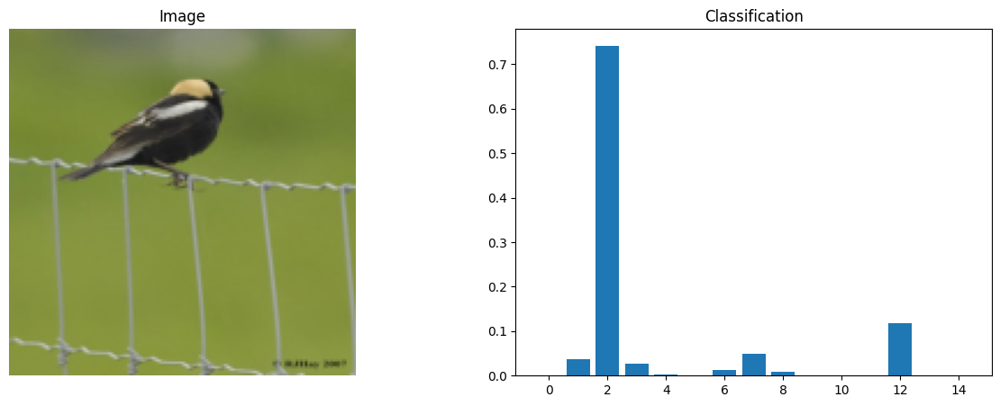

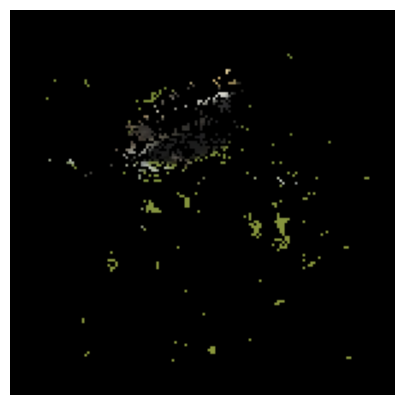

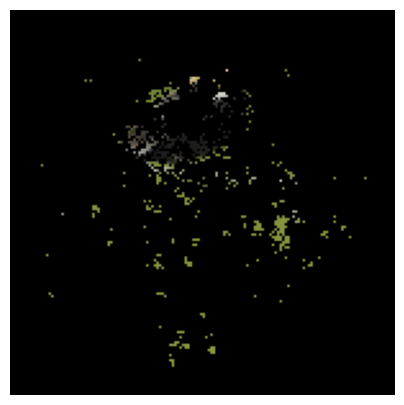

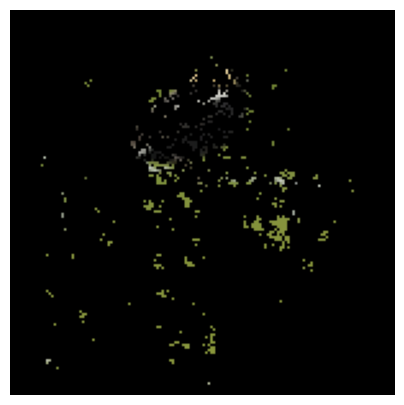

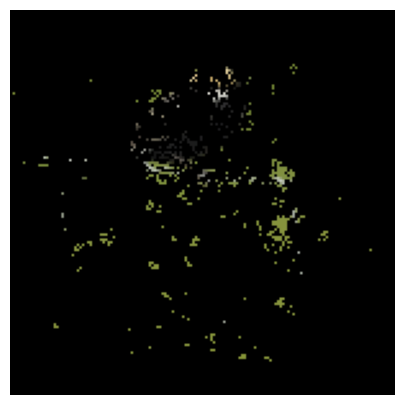

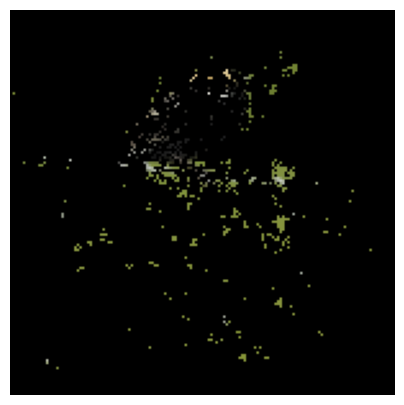

266


In [ ]:
# Now, choose a random image from the test set.
# Pass it through the encoder and get the encoding.
# Pass the encoding through the classifier and get the output.
# Show the image, the reconstruction, and the output of the classifier.
# Now, choose any 5 features out of the 512.
# Compute the activation map of each feature for the image.
# Show the activation map of each feature.

# Choose a random image from the test set
# image_number = torch.randint(0, len(train_dataset), (1,)).item()
image_copy = image.clone()

# Pass the encoding through the classifier and get the output
attributes, classification = model(image)


# Show the image, the reconstruction, and the output of the classifier
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
axes[0].imshow(np.transpose(image.detach().squeeze().cpu(), (1, 2, 0)))
axes[0].axis('off')
axes[0].set_title('Image')
axes[1].bar(range(LABEL_VECTOR_SIZE), torch.softmax(classification, dim=1).squeeze().cpu().detach())
axes[1].set_title('Classification')
plt.show()


# Find the encoding of the image and find the top 5 activations indices as features
features = torch.topk(encoding.squeeze(), 5).indices

for feature in features:
    # Compute the gradient of the encoding with respect to the image
    image.requires_grad = True
    encoding = cifar_encoder(image)
    encoding[:, feature].backward()

    # Find the top 500 pixels that activate the feature the most using the highest absolute gradient values
    activation_map = image.grad.squeeze().abs().sum(0)
    activation_map = activation_map - activation_map.min()
    activation_map = activation_map / activation_map.max()

    # Find the top 500 pixels that activate the feature the most
    top_pixels = activation_map.flatten().topk(600).indices
    top_pixels = torch.stack([top_pixels // 150, top_pixels % 150])

    # Plot the image, now with just the top 500 pixels that activate the feature the most. That is, 500 pixels should be same as the original image and the rest 524 (1024 - 500) pixels should be black.
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
    new_image = torch.zeros((3, 150, 150))
    new_image[:, top_pixels[0], top_pixels[1]] = image_copy.squeeze()[:, top_pixels[0], top_pixels[1]]
    axes.imshow(np.transpose(new_image.detach().cpu(), (1, 2, 0)))
    axes.axis('off')
    plt.show()
print(image_number)

## Computing Perturbation

Label to be changed from 003.Sooty_Albatross to 005.Crested_Auklet
tensor([-0.0476, -0.0598, -0.0070,  0.0258, -0.0124,  0.0439,  0.0510, -0.0071,
        -0.0540,  0.0538, -0.0303,  0.0592,  0.0019, -0.0464, -0.0291],
       grad_fn=<SelectBackward0>) tensor(-0.0124, grad_fn=<SelectBackward0>) tensor([-4.0991,  1.2498,  4.2683,  0.9246, -1.0643, -1.9239,  0.1988,  1.5711,
        -0.2973, -2.8596, -2.7929, -4.7890,  2.4294, -3.5697, -3.3373],
       grad_fn=<SelectBackward0>) tensor(-1.0643, grad_fn=<SelectBackward0>) 4
Constraint 0: 0.03520580381155014 * p >= -3.034834861755371
Constraint 1: 0.047439124435186386 * p >= 2.3140482902526855
Constraint 2: -0.005314442794770002 * p >= 5.332570552825928
Constraint 3: -0.03817044571042061 * p >= 1.9889166355133057
Constraint 5: -0.0562581829726696 * p >= -0.8596230745315552
Constraint 6: -0.06339186429977417 * p >= 1.2631335258483887
Constraint 7: -0.005202108528465033 * p >= 2.635416269302368
Constraint 8: 0.041645169258117676 * p >= 0.766

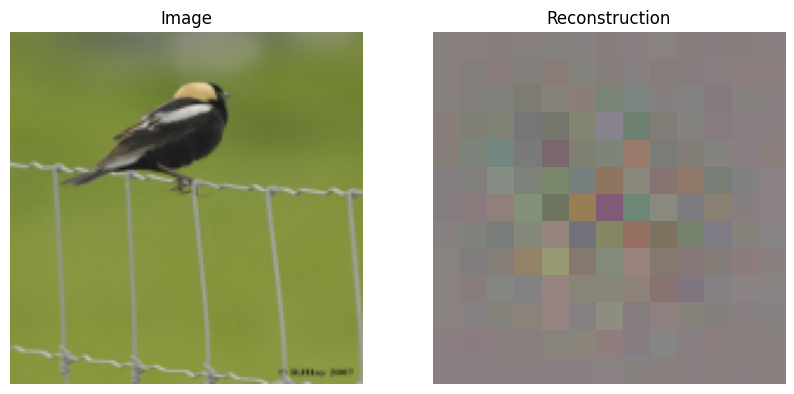

================= FEATURE 5 =================
================= COMPUTING PERTURBED IMAGE FOR FEATURE 5 =================
Iteration 0, Loss = 28.768661499023438, Feature Value Difference = -94.7408127784729
Absolute Feature Vector Difference = 94.74081420898438
 Required feature value = -97.7570571899414, Obtained feature value = -3.016244411468506
MSE Loss = 28.768661499023438
Cosine Similarity Loss = 0.42770707607269287
MSE Reconstruction Loss = 0.0
Direct Class Change Loss = 7.779463768005371
Experimentation Loss = 2.0463630789890885e-12
Structural Similarity Loss = -1.0
================= RESULTS FOR FEATURE 5 AFTER PERTURBING=================
Initial Encoding of Feature 5 = -3.016244411468506
Required Encoding of Feature 5 = -97.7570571899414
Learned Encoding of Feature 5 = -12.334073066711426
================= FEATURE 18 =================
================= COMPUTING PERTURBED IMAGE FOR FEATURE 18 =================
Iteration 0, Loss = 16.209074020385742, Feature Value Difference = 

In [ ]:
print(f"Label to be changed from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}")


# Find difference between class logits of all the labels except the new label
all_label_logits = class_logits[0]
new_label_logits = all_label_logits[new_label]
minimal_perturbations = []
no_perturbation_features = []
top_20_minimum_perturbations = {}

for feature in range (len(encoding[0])):
    # Find the classifier weights for the feature for the class of the image and the other label
    # weight_feature_actual_classes is the classifier weights of the feature of all classes other than "other class"
    weight_feature_all_classes = classifier_weights[:, feature]
    weight_feature_new_class = classifier_weights[new_label, feature]
    print(weight_feature_all_classes, weight_feature_new_class, all_label_logits, new_label_logits, new_label)
    minimal_perturbation = compute_minimal_perturbation(weight_feature_new_class, weight_feature_all_classes, all_label_logits, new_label_logits, new_label)
    if not minimal_perturbation[1]:
        print(f"It is not possible to perturb feature number {feature} to change the prediction from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}")
        no_perturbation_features.append(feature)
        continue
    # Compute the difference between the weights
    minimal_perturbations.append(minimal_perturbation[0])
    if len(top_20_minimum_perturbations) < 20:
        top_20_minimum_perturbations[feature] = minimal_perturbation[0]
    else:
        # max_key is the key with the maximum absolute value of the perturbation in the dictionary
        max_key = max(top_20_minimum_perturbations, key=lambda x: abs(top_20_minimum_perturbations[x]))
        if abs(minimal_perturbation[0]) < abs(top_20_minimum_perturbations[max_key]):
            del top_20_minimum_perturbations[max_key]
            top_20_minimum_perturbations[feature] = minimal_perturbation[0]
    print(f"Minimal Perturbation Required in Feature Number {feature} to change the prediction from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]} is {minimal_perturbation[0]}")
print("--------------------------------------------------------------------")

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
axes[0].imshow(np.transpose(image.detach().squeeze().cpu(), (1, 2, 0)))
axes[0].axis('off')
axes[0].set_title('Image')
plt.show()

no_perturb= 0
images_to_plot = []
perturbation_explanations = []
for feature in top_20_minimum_perturbations:
    print("================= FEATURE {} =================".format(feature))
    if feature in no_perturbation_features:
        no_perturb += 1
        continue
    encoding_copy = encoding.clone().detach()
    # Perturb the encoding of the image by the minimal perturbation
    # encoding[feature] += minimal_perturbations[index]
    encoding_copy[0, feature] += top_20_minimum_perturbations[feature]

    # Run the perturbed encoding through the classifier and get the logits of the actual class and the other class
    class_logits_from_new_encoding = classifier(encoding_copy)
    
    # Reconstruct the image based on the perturbed encoding_copy
    print(f"================= COMPUTING PERTURBED IMAGE FOR FEATURE {feature} =================")
    perturbed_image, mse_loss, cosine_sim_loss, mse_recon_loss = construct_perturbed_image(model, encoding_copy, image, feature, new_label)

    # Run the perturbed image through the classifier and plot the output    
    class_prediction_from_new_encoding = torch.softmax(class_logits_from_new_encoding, dim=1).argmax()

    class_logits_new = classifier(cifar_encoder(perturbed_image).view(1, -1))
    _, class_prediction_from_new_image = torch.max(class_logits_new, 1)
    print(f"================= RESULTS FOR FEATURE {feature} AFTER PERTURBING=================")
    # print(f"Original Class Logits: {class_logits[0]}, New Class Logits: {class_logits_new[0]}\nActual Class: {label}, Predicted Class From New Image: {class_prediction_from_new_image.item()}, Predicted Class from Encoding: {class_prediction_from_new_encoding.item()}")
    print(f"Initial Encoding of Feature {feature} = {cifar_encoder(image).detach()[0, feature]}")
    print(f"Required Encoding of Feature {feature} = {encoding_copy[0, feature]}")
    print(f"Learned Encoding of Feature {feature} = {cifar_encoder(perturbed_image).detach()[0, feature]}")
    if class_prediction_from_new_image.item() == new_label:
        if len(images_to_plot) < 5:
            images_to_plot.append((feature, top_20_minimum_perturbations[feature], class_logits_new, cifar_encoder(image).detach()[0], cifar_encoder(perturbed_image).detach()[0], 
                                   perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss))
        else:
            if mse_loss + mse_recon_loss < max([x[-1] + x[-3] for x in images_to_plot]):
                replace_index = np.argmax([x[-1] + x[-3] for x in images_to_plot])
                images_to_plot[replace_index] = (feature, top_20_minimum_perturbations[feature], class_logits_new, cifar_encoder(image).detach()[0], cifar_encoder(perturbed_image).detach()[0], 
                                                 perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss)
    print("=====================================================================================================")

In [ ]:

# Path to the attributes file
attributes_file = './data/CUB_200_2011/attributes.txt'

# Get attribute names as a list
attribute_names = get_attribute_names(attributes_file)

# Print the first few attributes as a preview
print("Total attributes:", len(attribute_names))
print("Sample attributes:", attribute_names[:10])

Total attributes: 312
Sample attributes: ['has_bill_shape::curved_(up_or_down)', 'has_bill_shape::dagger', 'has_bill_shape::hooked', 'has_bill_shape::needle', 'has_bill_shape::hooked_seabird', 'has_bill_shape::spatulate', 'has_bill_shape::all-purpose', 'has_bill_shape::cone', 'has_bill_shape::specialized', 'has_wing_color::blue']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


================= PLOTTING IMAGES =================
================= PLOTTING IMAGE 0 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 0.3884979784488678
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 2.992647171020508
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 2.992647171020508
Prediction of the Perturbed Encoding: tensor([[-0.3498,  1.5192,  0.3885,  0.9365,  2.9926, -0.8174,  1.0073, -1.5951,
          0.1542, -2.0922, -5.4785, -0.9978,  2.9926, -5.2425, -5.4771]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: 0.172959566116333
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 2.817483901977539
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Aukle

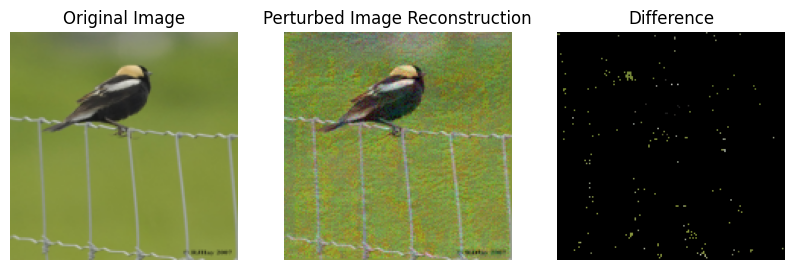

================= PLOTTING IMAGE 1 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 2.283477783203125
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 2.2834784984588623
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 2.2834784984588623
Prediction of the Perturbed Encoding: tensor([[-4.6009, -0.3336,  2.2835, -1.0179,  2.2835, -0.2518, -1.5920, -1.9640,
         -0.3622, -7.2257, -3.5916, -6.1789, -0.0562,  1.0138,  0.4062]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: 2.486802339553833
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 3.3212883472442627
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Auklet: tensor([3.3213], grad_fn=<IndexBackward0>)
Pred

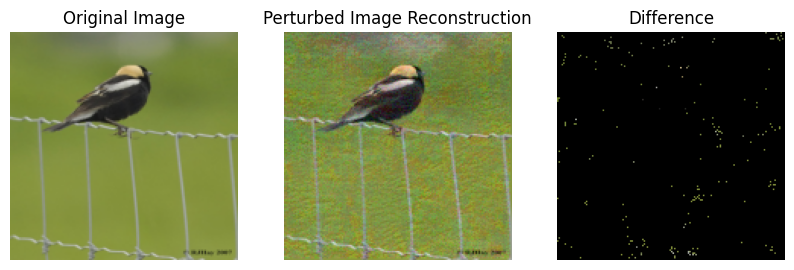

================= PLOTTING IMAGE 2 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 2.2820868492126465
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 2.365109443664551
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 2.365109443664551
Prediction of the Perturbed Encoding: tensor([[-3.0997,  1.5983,  2.2821, -1.8768,  2.3651, -1.7316, -0.5940, -2.3281,
          2.3651, -5.5953, -4.9780, -4.8746, -0.5501, -5.4685, -2.8718]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: 3.0875139236450195
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 3.104034423828125
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Auklet: tensor([3.1040], grad_fn=<IndexBackward0>)
Predi

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


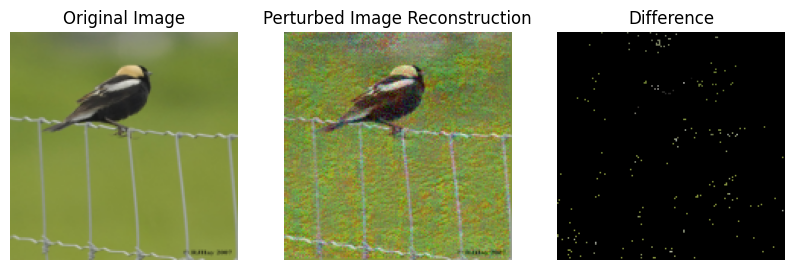

================= PLOTTING IMAGE 3 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 0.23771943151950836
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 1.9411894083023071
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 1.9411894083023071
Prediction of the Perturbed Encoding: tensor([[-5.0409,  1.5742,  0.2377,  0.8336,  1.9412,  1.0852,  1.5906, -0.3367,
          1.7374, -1.7080,  0.1064, -8.1345,  1.9412,  1.2645, -0.8852]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: -0.862426221370697
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 1.479651689529419
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Auklet: tensor([1.4797], grad_fn=<IndexBackward0>)
Pr

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


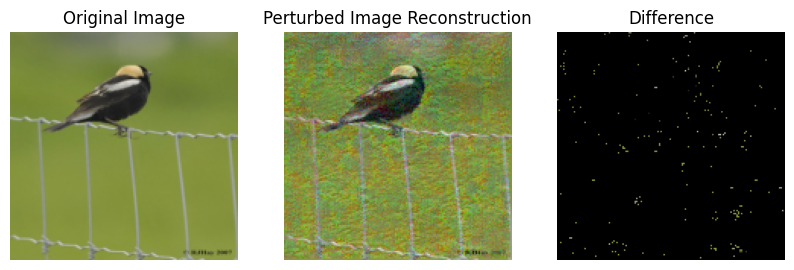

================= PLOTTING IMAGE 4 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 4.045605659484863
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 4.478386402130127
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 4.478386402130127
Prediction of the Perturbed Encoding: tensor([[-1.7986,  1.8636,  4.0456, -2.6206,  4.4784,  1.7842,  0.8990,  4.4784,
         -0.9763, -2.7535, -7.1394, -9.7878, -0.8014, -0.0419,  0.2744]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: 3.7843496799468994
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 4.011556625366211
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Auklet: tensor([4.0116], grad_fn=<IndexBackward0>)
Predic

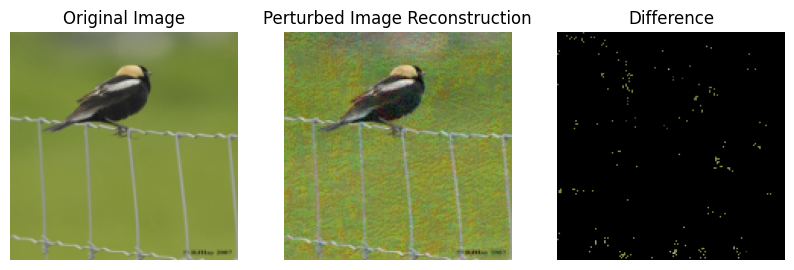

In [ ]:
print(f"================= PLOTTING IMAGES =================")
for index, image_set in enumerate(images_to_plot):
    feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set
    print(f"================= PLOTTING IMAGE {index} =================")
    # print(f"Original Class Logits: {class_logits[0]}")
    print(f"Class Logit of the Perturbed Image for the Original Class (from new encoding)- {cub_all_class_names.iloc[class_prediction.item(), 1]}: {class_logits_from_new_encoding[0, class_prediction.item()]}")
    print(f"Class Logit of the Perturbed Image for the Other Class (from new encoding)- {cub_all_class_names.iloc[new_label, 1]}: {class_logits_from_new_encoding[0, new_label]}")
    print(f"Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- {cub_all_class_names.iloc[class_prediction_from_new_encoding.item(), 1]}: {class_logits_from_new_encoding[0, class_prediction_from_new_encoding]}")
    print(f"Prediction of the Perturbed Encoding: {(class_logits_from_new_encoding)}")

    print(f"Class Logit of the Perturbed Image for the Original Class (from new image)- {cub_all_class_names.iloc[class_prediction.item(), 1]}: {class_logits_new[0, class_prediction.item()]}")
    print(f"Class Logit of the Perturbed Image for the new Class (from new image)- {cub_all_class_names.iloc[new_label, 1]}: {class_logits_new[0, new_label]}")
    print(f"Class Logit of the Perturbed Image for the Predicted Class (from new image)- {cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1]}: {class_logits_new[0, class_prediction_from_new_image]}")
    print(f"Prediction of the Reconstructed Perturbed Image: {class_logits_new}")

    print("-------------------------------------")
    print(f"Feature {feature} - {attribute_names[feature]}")
    print(f"Perturbation Required: {perturbation}")
    # Softmax of initial encoding
    print(f"Initial Class Logits: {class_logits[0]}, Class Prediction: {torch.argmax(class_logits[0])}")
    print(f"New Class Logits: {class_logits_new[0]}, Class Prediction: {torch.argmax(class_logits_new[0])}")
    print("=====================================================================================================")
    # Plot the original image and the perturbed image side by side
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
    axes[0].imshow(np.transpose(image.squeeze().cpu().detach(), (1, 2, 0)))
    axes[0].axis('off')
    axes[0].set_title('Original Image')
    axes[1].imshow(np.transpose(perturbed_image[0].cpu().detach(), (1, 2, 0)))
    axes[1].axis('off')
    axes[1].set_title('Perturbed Image Reconstruction')
    # Subtract the images and show only the top 200 pixels that are different and non-zero
    # diff = abs(image - perturbed_image)
    # pixels_altered = diff.flatten().topk(200).indices
    # non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
    # Subtract the images and show only the top 200 pixels that are different (sum over 3 channels) and non-zero. diff shape should be [150, 150]
    diff = abs(image - perturbed_image).sum(1)

    pixels_altered = diff.flatten().topk(200).indices
    non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
    # Plot black if not in non_zero_pixels_altered, else plot the actual image pixel value
    new_image = torch.zeros((3, 150, 150))
    new_image[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150] = image.squeeze()[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150]
    axes[2].imshow(np.transpose(new_image.detach().cpu(), (1, 2, 0)))
    axes[2].axis('off')
    axes[2].set_title('Difference')
    plt.show()
    print("=====================================================================================================")

In [ ]:
# Define the CSV file path
csv_file_path = 'perturbation_results.csv'

# Check if CSV file exists, if not create it with a header
file_exists = os.path.isfile(csv_file_path)

# Open the CSV file for writing (append mode if it exists)
with open(csv_file_path, mode='a' if file_exists else 'w', newline='') as file:
    writer = csv.writer(file)
    
    # Write the header if the file is new
    if not file_exists:
        writer.writerow(['image_file_name', 'original_class', 'perturbed_class', 'feature_index', 'feature_name', 'perturbation_required', 'perturbed_image_file_name'])
    
    for index, image_set in enumerate(images_to_plot):
        feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set
        
        # Define the original and perturbed image file names
        original_image_file_name = f'original_image_{index}.png'
        perturbed_image_file_name = f'perturbed_image_{index}.png'
        
        # Create directory for the perturbed images corresponding to the class change if it doesn't exist
        class_change_dir = f'perturbed_images/{cub_all_class_names.iloc[class_prediction.item(), 1]}_to_{cub_all_class_names.iloc[new_label, 1]}_{index}'
        os.makedirs(class_change_dir, exist_ok=True)
        
        # Save the original image, perturbed image, and the difference image in one image and save in the perturbed_images directory
        original_image = np.transpose(image.squeeze().cpu().detach(), (1, 2, 0))
        diff = abs(image - perturbed_image).sum(1)
        
        perturbed_image = np.transpose(perturbed_image[0].cpu().detach(), (1, 2, 0))

        pixels_altered = diff.flatten().topk(200).indices
        non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
        new_image = torch.zeros((3, 150, 150))

        new_image[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150] = image.squeeze()[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150]
        diff_image = np.transpose(new_image.detach().cpu(), (1, 2, 0))
        combined_image = np.concatenate([original_image, perturbed_image, diff_image], axis=1)
        
        # Title for the image
        title = f"Changing from class {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}\n by perturbing Feature {attribute_names[feature]} by {perturbation:.2f}"
        
        # Convert image to PIL Image to add text
        combined_image = (combined_image * 255).astype(np.uint8)
        combined_image_pil = Image.fromarray(combined_image)
        
        # Draw title text on the image
        draw = ImageDraw.Draw(combined_image_pil)
        
        # Use a truetype font (can be replaced with any other font or size)
        try:
            font = ImageFont.truetype("arial.ttf", size=12)
        except IOError:
            font = ImageFont.load_default()

        # Add title text at the top of the image
        text_width, text_height = combined_image_pil.size
        text_position = ((combined_image_pil.width - text_width) // 2, 10)  # Centered at top
        draw.text(text_position, title, font=font, fill=(255, 255, 255))

        # Save the image with the title
        combined_image_pil.save(f'{class_change_dir}/feature_{attribute_names[feature]}.png')

        # Log the results in the CSV file
        writer.writerow([
            original_image_file_name,
            cub_all_class_names.iloc[class_prediction.item(), 1],
            cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1],
            feature,
            attribute_names[feature],
            perturbation,
            perturbed_image_file_name
        ])


In [ ]:
# In every directory in perturbed_images, add a .txt file which has the following information:
# - The original class of the image
# - The perturbed class of the image
# - The feature that was perturbed
# - The perturbation required to change the class
# - The fraction of perturbation required to change the class (perturbation / feature value in original image)
# - The feature name
# - The feature value of the original image (0 or 1)
# - The feature value of the perturbed image (0 or 1)

# Define the text file path
text_file_path = 'perturbation_results.txt'

# Open the text file for writing (append mode if it exists)
with open(text_file_path, 'a' if os.path.isfile(text_file_path) else 'w') as file:
    for index, image_set in enumerate(images_to_plot):
        feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set

        # Define the original and perturbed image file names
        original_image_file_name = f'original_image_{index}.png'

        # Create directory for the perturbed images corresponding to the class change if it doesn't exist
        class_change_dir = f'perturbed_images/{cub_all_class_names.iloc[class_prediction.item(), 1]}_to_{cub_all_class_names.iloc[new_label, 1]}_{index}'

        # Write the information to the text file
        file.write(f"Original Class: {cub_all_class_names.iloc[class_prediction.item(), 1]}\n")
        file.write(f"Perturbed Class: {cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1]}\n")
        file.write(f"Feature Index: {feature}\n")
        file.write(f"Feature Name: {attribute_names[feature]}\n")
        file.write(f"Perturbation Required: {perturbation}\n")
        file.write(f"Fraction of Perturbation Required: {abs(perturbation) / abs(initial_encoding[feature])}\n")
        file.write(f"Feature Value in Original Image: {initial_encoding[feature]}\n")
        file.write(f"Feature Value in Perturbed Image: {perturbed_encoding[feature]}\n")
        file.write("\n")

# Print the path to the CSV file
print(f"CSV file saved at: {csv_file_path}")

CSV file saved at: perturbation_results.csv


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


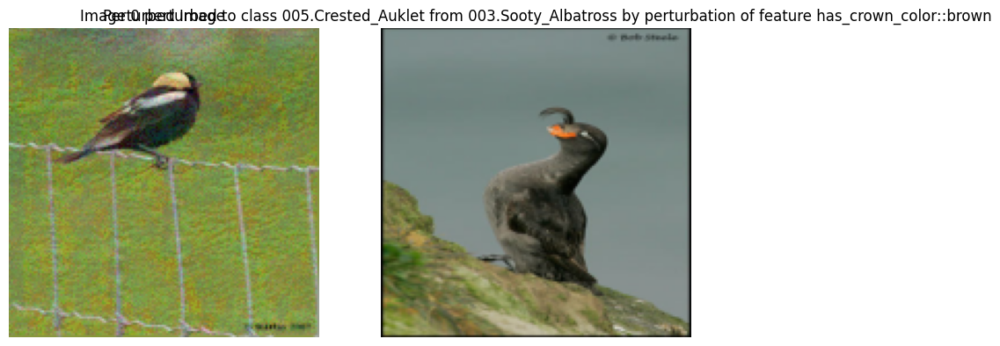

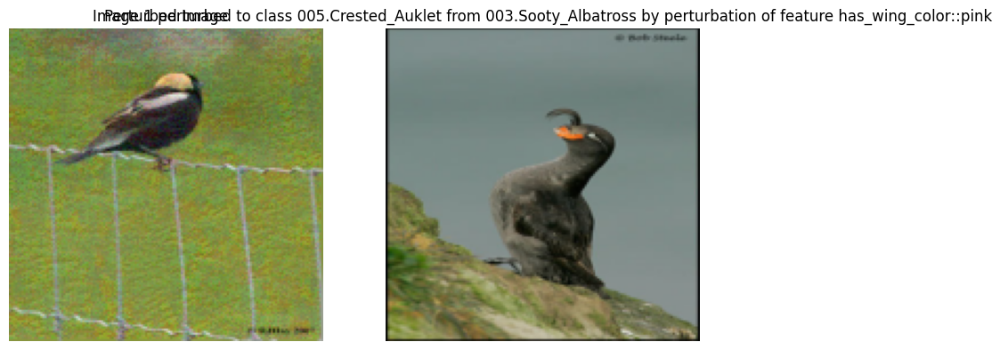

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


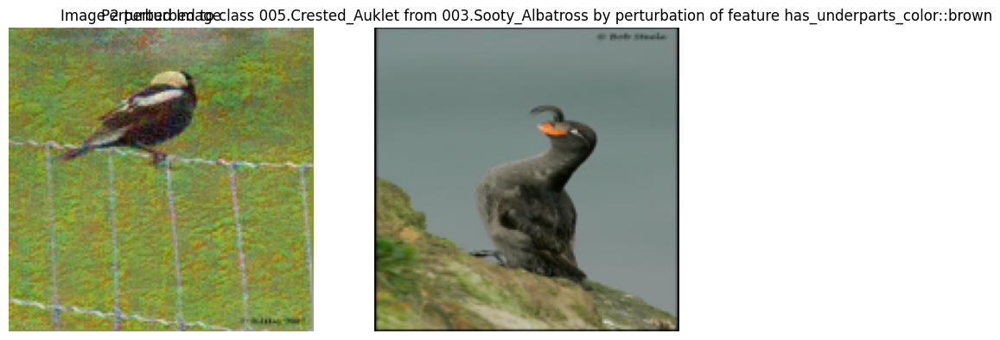

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


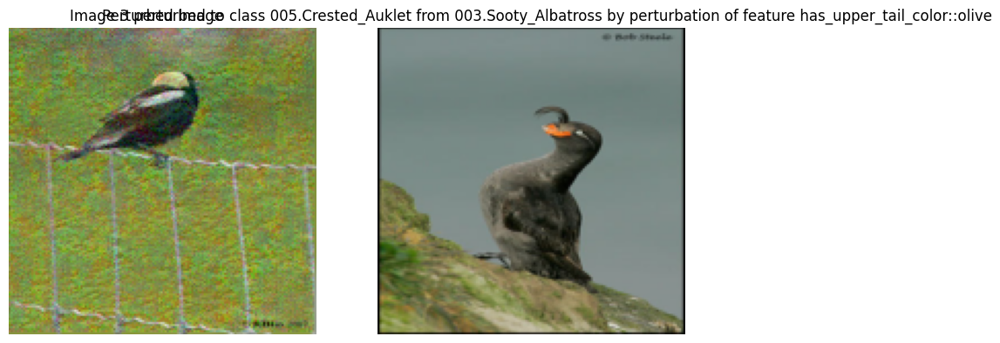

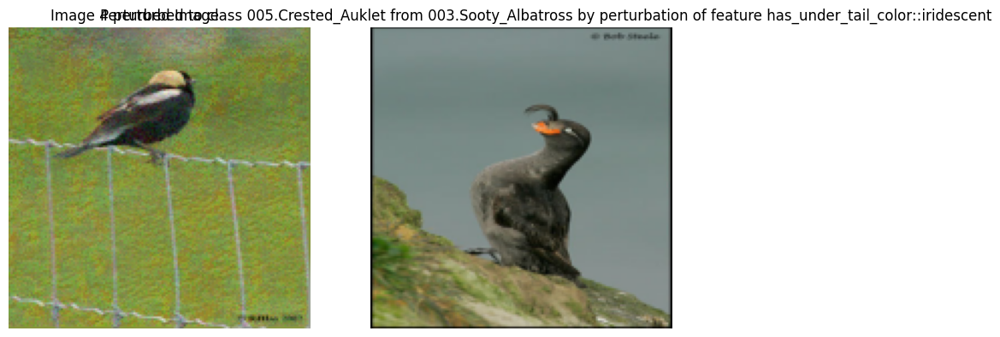

In [ ]:
# Iterate through each perturbed image
for index, image_set in enumerate(images_to_plot):
    perturbed_image = image_set[5]
    new_class = new_label

    max_ssim = -1
    most_similar_image = None
    minimum_feature_difference = math.inf
    # Iterate through all images in the new class
    for i in range(len(train_dataset)):
        image, _, label = train_dataset[i]
        if label == new_class:
            current_ssim = ssim(
                perturbed_image.squeeze().detach().cpu().numpy(),
                image.squeeze().detach().cpu().numpy(), 
                data_range=1.0,  # Assuming images are normalized between 0 and 1
                channel_axis=0  # Adjust this if your channel is on a different axis
            )
            if current_ssim > max_ssim:
                max_ssim = current_ssim
                most_similar_image = image
            # Check if the feature value of the image is close to the perturbed image
            # if cifar_encoder(image.unsqueeze(0)).squeeze()[feature] - perturbed_encoding[feature] < minimum_feature_difference:
            #     most_similar_image = image
            #     minimum_feature_difference = cifar_encoder(image.unsqueeze(0)).squeeze()[feature] - perturbed_encoding[feature]

    # Plot the perturbed image and the most similar image side by side
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
    axes[0].imshow(perturbed_image.detach().squeeze().permute(1, 2, 0).cpu().numpy())
    axes[0].axis('off')
    axes[0].set_title('Perturbed Image')

    axes[1].imshow(most_similar_image.permute(1, 2, 0).cpu().numpy())
    axes[1].axis('off')
    axes[1].set_title('Most Similar Image in New Class')
    plt.title(f"Image {index} perturbed to class {cub_all_class_names.iloc[new_label, 1]} from {cub_all_class_names.iloc[class_prediction.item(), 1]} by perturbation of feature {attribute_names[image_set[0]]}")

    plt.show()


## Visualizations

In [ ]:
image_number = random.randint(0, len(train_dataset))
image, _, _ = train_dataset[image_number]
image = image.unsqueeze(0).to(device)

encoding = cifar_encoder(image).detach()

# Find the class of the image
# Get the weights of just the first layer of the classifier
classifier = model.classifier
classifier_dense_layer = classifier
classifier_weights = classifier.weight  # [10, 64 * 4 * 4]

class_logits = classifier_dense_layer(encoding)
# print(class_logits)
class_prediction = torch.softmax(class_logits, dim=1).argmax()
# print(class_prediction.item())
print(f"Prediction of the Image: {class_prediction.item()} - Class Name : {cub_all_class_names.iloc[class_prediction.item(), 1]}, Actual Class: {train_dataset[image_number][2]} - {cub_all_class_names.iloc[train_dataset[image_number][2], 1]}")


# Choose another label that is not the class of the image
new_label = random.randint(0, 9)
while new_label == class_prediction:
    new_label = random.randint(0, 9)
print(f"New Label: {new_label} - {cub_all_class_names.iloc[new_label, 1]}")

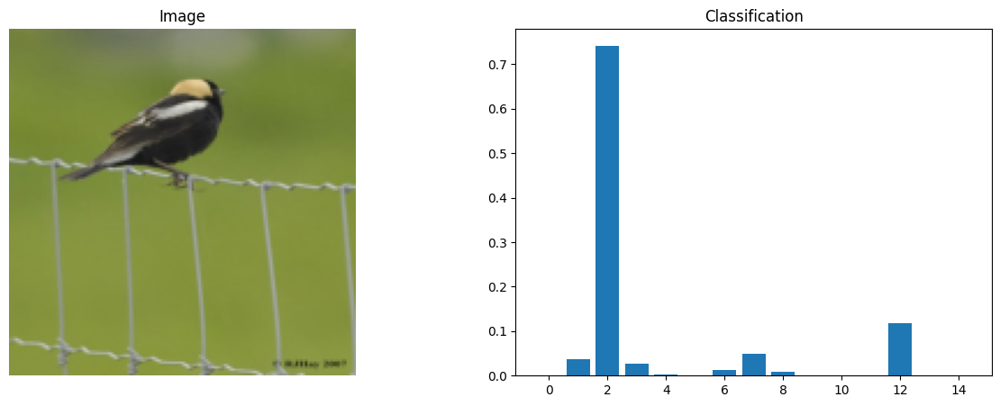

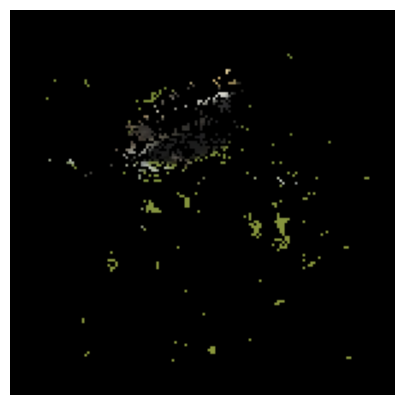

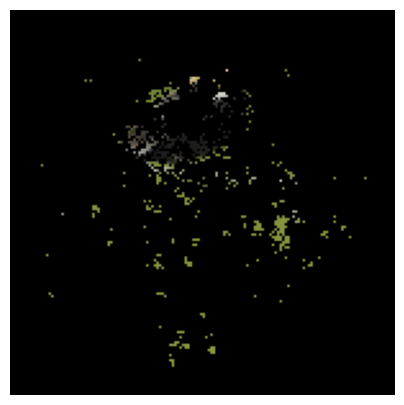

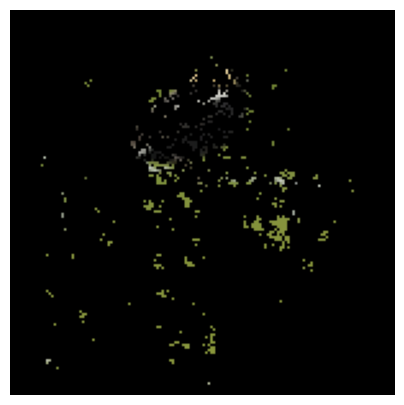

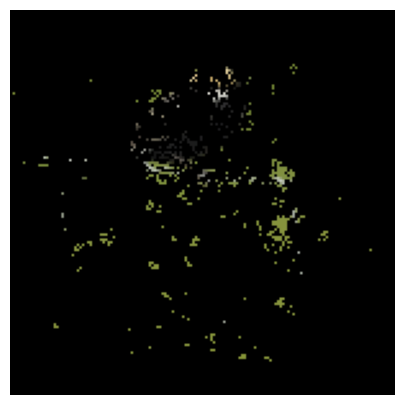

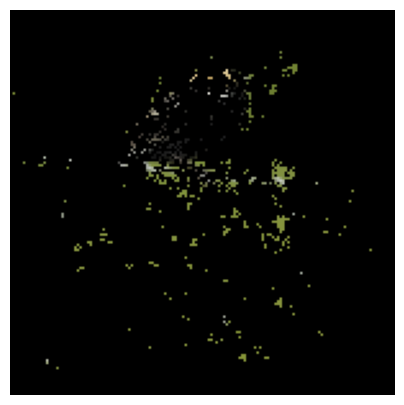

266


In [ ]:
# Now, choose a random image from the test set.
# Pass it through the encoder and get the encoding.
# Pass the encoding through the classifier and get the output.
# Show the image, the reconstruction, and the output of the classifier.
# Now, choose any 5 features out of the 512.
# Compute the activation map of each feature for the image.
# Show the activation map of each feature.

# Choose a random image from the test set
# image_number = torch.randint(0, len(train_dataset), (1,)).item()
image_copy = image.clone()

# Pass the encoding through the classifier and get the output
attributes, classification = model(image)


# Show the image, the reconstruction, and the output of the classifier
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
axes[0].imshow(np.transpose(image.detach().squeeze().cpu(), (1, 2, 0)))
axes[0].axis('off')
axes[0].set_title('Image')
axes[1].bar(range(LABEL_VECTOR_SIZE), torch.softmax(classification, dim=1).squeeze().cpu().detach())
axes[1].set_title('Classification')
plt.show()


# Find the encoding of the image and find the top 5 activations indices as features
features = torch.topk(encoding.squeeze(), 5).indices

for feature in features:
    # Compute the gradient of the encoding with respect to the image
    image.requires_grad = True
    encoding = cifar_encoder(image)
    encoding[:, feature].backward()

    # Find the top 500 pixels that activate the feature the most using the highest absolute gradient values
    activation_map = image.grad.squeeze().abs().sum(0)
    activation_map = activation_map - activation_map.min()
    activation_map = activation_map / activation_map.max()

    # Find the top 500 pixels that activate the feature the most
    top_pixels = activation_map.flatten().topk(600).indices
    top_pixels = torch.stack([top_pixels // 150, top_pixels % 150])

    # Plot the image, now with just the top 500 pixels that activate the feature the most. That is, 500 pixels should be same as the original image and the rest 524 (1024 - 500) pixels should be black.
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
    new_image = torch.zeros((3, 150, 150))
    new_image[:, top_pixels[0], top_pixels[1]] = image_copy.squeeze()[:, top_pixels[0], top_pixels[1]]
    axes.imshow(np.transpose(new_image.detach().cpu(), (1, 2, 0)))
    axes.axis('off')
    plt.show()
print(image_number)

## Computing Perturbation

Label to be changed from 003.Sooty_Albatross to 005.Crested_Auklet
tensor([-0.0476, -0.0598, -0.0070,  0.0258, -0.0124,  0.0439,  0.0510, -0.0071,
        -0.0540,  0.0538, -0.0303,  0.0592,  0.0019, -0.0464, -0.0291],
       grad_fn=<SelectBackward0>) tensor(-0.0124, grad_fn=<SelectBackward0>) tensor([-4.0991,  1.2498,  4.2683,  0.9246, -1.0643, -1.9239,  0.1988,  1.5711,
        -0.2973, -2.8596, -2.7929, -4.7890,  2.4294, -3.5697, -3.3373],
       grad_fn=<SelectBackward0>) tensor(-1.0643, grad_fn=<SelectBackward0>) 4
Constraint 0: 0.03520580381155014 * p >= -3.034834861755371
Constraint 1: 0.047439124435186386 * p >= 2.3140482902526855
Constraint 2: -0.005314442794770002 * p >= 5.332570552825928
Constraint 3: -0.03817044571042061 * p >= 1.9889166355133057
Constraint 5: -0.0562581829726696 * p >= -0.8596230745315552
Constraint 6: -0.06339186429977417 * p >= 1.2631335258483887
Constraint 7: -0.005202108528465033 * p >= 2.635416269302368
Constraint 8: 0.041645169258117676 * p >= 0.766

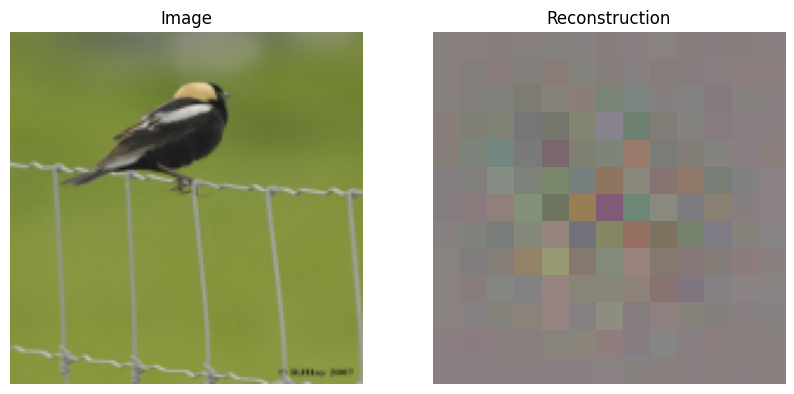

================= FEATURE 5 =================
================= COMPUTING PERTURBED IMAGE FOR FEATURE 5 =================
Iteration 0, Loss = 28.768661499023438, Feature Value Difference = -94.7408127784729
Absolute Feature Vector Difference = 94.74081420898438
 Required feature value = -97.7570571899414, Obtained feature value = -3.016244411468506
MSE Loss = 28.768661499023438
Cosine Similarity Loss = 0.42770707607269287
MSE Reconstruction Loss = 0.0
Direct Class Change Loss = 7.779463768005371
Experimentation Loss = 2.0463630789890885e-12
Structural Similarity Loss = -1.0
================= RESULTS FOR FEATURE 5 AFTER PERTURBING=================
Initial Encoding of Feature 5 = -3.016244411468506
Required Encoding of Feature 5 = -97.7570571899414
Learned Encoding of Feature 5 = -12.334073066711426
================= FEATURE 18 =================
================= COMPUTING PERTURBED IMAGE FOR FEATURE 18 =================
Iteration 0, Loss = 16.209074020385742, Feature Value Difference = 

In [ ]:
print(f"Label to be changed from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}")


# Find difference between class logits of all the labels except the new label
all_label_logits = class_logits[0]
new_label_logits = all_label_logits[new_label]
minimal_perturbations = []
no_perturbation_features = []
top_20_minimum_perturbations = {}

for feature in range (len(encoding[0])):
    # Find the classifier weights for the feature for the class of the image and the other label
    # weight_feature_actual_classes is the classifier weights of the feature of all classes other than "other class"
    weight_feature_all_classes = classifier_weights[:, feature]
    weight_feature_new_class = classifier_weights[new_label, feature]
    print(weight_feature_all_classes, weight_feature_new_class, all_label_logits, new_label_logits, new_label)
    minimal_perturbation = compute_minimal_perturbation(weight_feature_new_class, weight_feature_all_classes, all_label_logits, new_label_logits, new_label)
    if not minimal_perturbation[1]:
        print(f"It is not possible to perturb feature number {feature} to change the prediction from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}")
        no_perturbation_features.append(feature)
        continue
    # Compute the difference between the weights
    minimal_perturbations.append(minimal_perturbation[0])
    if len(top_20_minimum_perturbations) < 20:
        top_20_minimum_perturbations[feature] = minimal_perturbation[0]
    else:
        # max_key is the key with the maximum absolute value of the perturbation in the dictionary
        max_key = max(top_20_minimum_perturbations, key=lambda x: abs(top_20_minimum_perturbations[x]))
        if abs(minimal_perturbation[0]) < abs(top_20_minimum_perturbations[max_key]):
            del top_20_minimum_perturbations[max_key]
            top_20_minimum_perturbations[feature] = minimal_perturbation[0]
    print(f"Minimal Perturbation Required in Feature Number {feature} to change the prediction from {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]} is {minimal_perturbation[0]}")
print("--------------------------------------------------------------------")

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
axes[0].imshow(np.transpose(image.detach().squeeze().cpu(), (1, 2, 0)))
axes[0].axis('off')
axes[0].set_title('Image')
plt.show()

no_perturb= 0
images_to_plot = []
perturbation_explanations = []
for feature in top_20_minimum_perturbations:
    print("================= FEATURE {} =================".format(feature))
    if feature in no_perturbation_features:
        no_perturb += 1
        continue
    encoding_copy = encoding.clone().detach()
    # Perturb the encoding of the image by the minimal perturbation
    # encoding[feature] += minimal_perturbations[index]
    encoding_copy[0, feature] += top_20_minimum_perturbations[feature]

    # Run the perturbed encoding through the classifier and get the logits of the actual class and the other class
    class_logits_from_new_encoding = classifier(encoding_copy)
    
    # Reconstruct the image based on the perturbed encoding_copy
    print(f"================= COMPUTING PERTURBED IMAGE FOR FEATURE {feature} =================")
    perturbed_image, mse_loss, cosine_sim_loss, mse_recon_loss = construct_perturbed_image(model, encoding_copy, image, feature, new_label)

    # Run the perturbed image through the classifier and plot the output    
    class_prediction_from_new_encoding = torch.softmax(class_logits_from_new_encoding, dim=1).argmax()

    class_logits_new = classifier(cifar_encoder(perturbed_image).view(1, -1))
    _, class_prediction_from_new_image = torch.max(class_logits_new, 1)
    print(f"================= RESULTS FOR FEATURE {feature} AFTER PERTURBING=================")
    # print(f"Original Class Logits: {class_logits[0]}, New Class Logits: {class_logits_new[0]}\nActual Class: {label}, Predicted Class From New Image: {class_prediction_from_new_image.item()}, Predicted Class from Encoding: {class_prediction_from_new_encoding.item()}")
    print(f"Initial Encoding of Feature {feature} = {cifar_encoder(image).detach()[0, feature]}")
    print(f"Required Encoding of Feature {feature} = {encoding_copy[0, feature]}")
    print(f"Learned Encoding of Feature {feature} = {cifar_encoder(perturbed_image).detach()[0, feature]}")
    if class_prediction_from_new_image.item() == new_label:
        if len(images_to_plot) < 5:
            images_to_plot.append((feature, top_20_minimum_perturbations[feature], class_logits_new, cifar_encoder(image).detach()[0], cifar_encoder(perturbed_image).detach()[0], 
                                   perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss))
        else:
            if mse_loss + mse_recon_loss < max([x[-1] + x[-3] for x in images_to_plot]):
                replace_index = np.argmax([x[-1] + x[-3] for x in images_to_plot])
                images_to_plot[replace_index] = (feature, top_20_minimum_perturbations[feature], class_logits_new, cifar_encoder(image).detach()[0], cifar_encoder(perturbed_image).detach()[0], 
                                                 perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss)
    print("=====================================================================================================")

In [ ]:

# Path to the attributes file
attributes_file = './data/CUB_200_2011/attributes.txt'

# Get attribute names as a list
attribute_names = get_attribute_names(attributes_file)

# Print the first few attributes as a preview
print("Total attributes:", len(attribute_names))
print("Sample attributes:", attribute_names[:10])

Total attributes: 312
Sample attributes: ['has_bill_shape::curved_(up_or_down)', 'has_bill_shape::dagger', 'has_bill_shape::hooked', 'has_bill_shape::needle', 'has_bill_shape::hooked_seabird', 'has_bill_shape::spatulate', 'has_bill_shape::all-purpose', 'has_bill_shape::cone', 'has_bill_shape::specialized', 'has_wing_color::blue']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


================= PLOTTING IMAGES =================
================= PLOTTING IMAGE 0 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 0.3884979784488678
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 2.992647171020508
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 2.992647171020508
Prediction of the Perturbed Encoding: tensor([[-0.3498,  1.5192,  0.3885,  0.9365,  2.9926, -0.8174,  1.0073, -1.5951,
          0.1542, -2.0922, -5.4785, -0.9978,  2.9926, -5.2425, -5.4771]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: 0.172959566116333
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 2.817483901977539
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Aukle

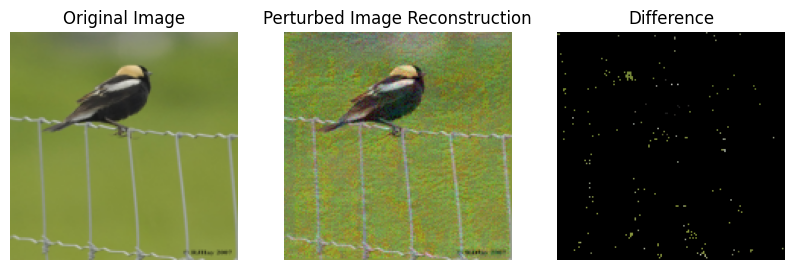

================= PLOTTING IMAGE 1 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 2.283477783203125
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 2.2834784984588623
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 2.2834784984588623
Prediction of the Perturbed Encoding: tensor([[-4.6009, -0.3336,  2.2835, -1.0179,  2.2835, -0.2518, -1.5920, -1.9640,
         -0.3622, -7.2257, -3.5916, -6.1789, -0.0562,  1.0138,  0.4062]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: 2.486802339553833
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 3.3212883472442627
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Auklet: tensor([3.3213], grad_fn=<IndexBackward0>)
Pred

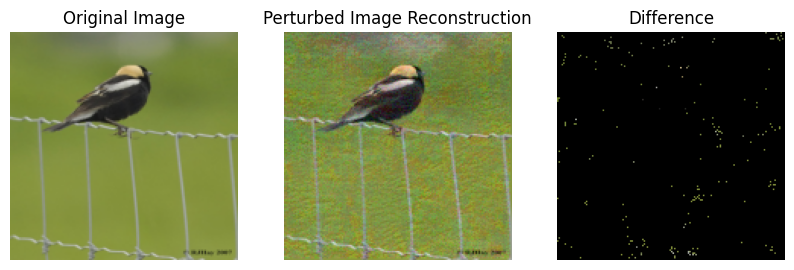

================= PLOTTING IMAGE 2 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 2.2820868492126465
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 2.365109443664551
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 2.365109443664551
Prediction of the Perturbed Encoding: tensor([[-3.0997,  1.5983,  2.2821, -1.8768,  2.3651, -1.7316, -0.5940, -2.3281,
          2.3651, -5.5953, -4.9780, -4.8746, -0.5501, -5.4685, -2.8718]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: 3.0875139236450195
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 3.104034423828125
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Auklet: tensor([3.1040], grad_fn=<IndexBackward0>)
Predi

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


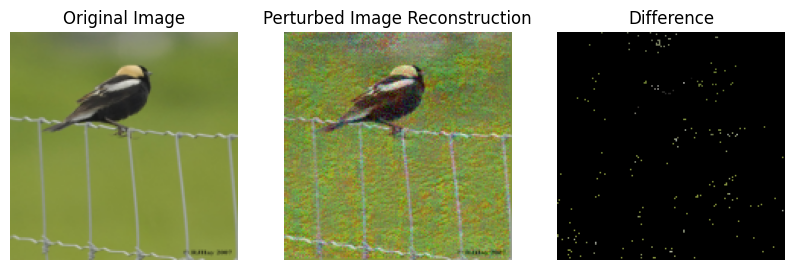

================= PLOTTING IMAGE 3 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 0.23771943151950836
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 1.9411894083023071
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 1.9411894083023071
Prediction of the Perturbed Encoding: tensor([[-5.0409,  1.5742,  0.2377,  0.8336,  1.9412,  1.0852,  1.5906, -0.3367,
          1.7374, -1.7080,  0.1064, -8.1345,  1.9412,  1.2645, -0.8852]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: -0.862426221370697
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 1.479651689529419
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Auklet: tensor([1.4797], grad_fn=<IndexBackward0>)
Pr

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


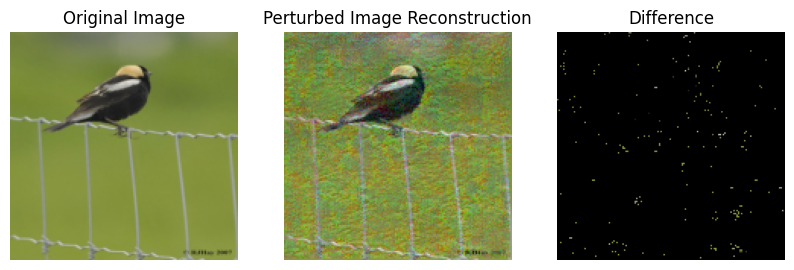

================= PLOTTING IMAGE 4 =================
Class Logit of the Perturbed Image for the Original Class (from new encoding)- 003.Sooty_Albatross: 4.045605659484863
Class Logit of the Perturbed Image for the Other Class (from new encoding)- 005.Crested_Auklet: 4.478386402130127
Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- 005.Crested_Auklet: 4.478386402130127
Prediction of the Perturbed Encoding: tensor([[-1.7986,  1.8636,  4.0456, -2.6206,  4.4784,  1.7842,  0.8990,  4.4784,
         -0.9763, -2.7535, -7.1394, -9.7878, -0.8014, -0.0419,  0.2744]],
       grad_fn=<AddmmBackward0>)
Class Logit of the Perturbed Image for the Original Class (from new image)- 003.Sooty_Albatross: 3.7843496799468994
Class Logit of the Perturbed Image for the new Class (from new image)- 005.Crested_Auklet: 4.011556625366211
Class Logit of the Perturbed Image for the Predicted Class (from new image)- 005.Crested_Auklet: tensor([4.0116], grad_fn=<IndexBackward0>)
Predic

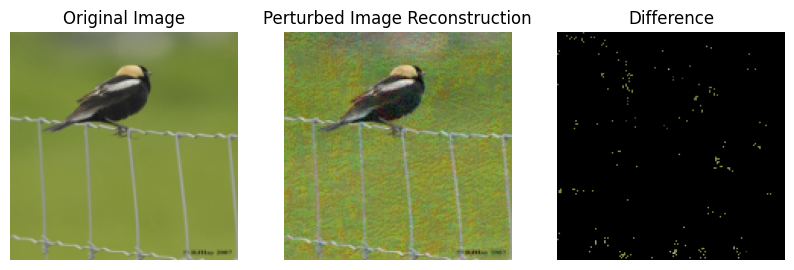

In [ ]:
print(f"================= PLOTTING IMAGES =================")
for index, image_set in enumerate(images_to_plot):
    feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set
    print(f"================= PLOTTING IMAGE {index} =================")
    # print(f"Original Class Logits: {class_logits[0]}")
    print(f"Class Logit of the Perturbed Image for the Original Class (from new encoding)- {cub_all_class_names.iloc[class_prediction.item(), 1]}: {class_logits_from_new_encoding[0, class_prediction.item()]}")
    print(f"Class Logit of the Perturbed Image for the Other Class (from new encoding)- {cub_all_class_names.iloc[new_label, 1]}: {class_logits_from_new_encoding[0, new_label]}")
    print(f"Class Logit of the Perturbed Image for the Predicted Class (from new encoding)- {cub_all_class_names.iloc[class_prediction_from_new_encoding.item(), 1]}: {class_logits_from_new_encoding[0, class_prediction_from_new_encoding]}")
    print(f"Prediction of the Perturbed Encoding: {(class_logits_from_new_encoding)}")

    print(f"Class Logit of the Perturbed Image for the Original Class (from new image)- {cub_all_class_names.iloc[class_prediction.item(), 1]}: {class_logits_new[0, class_prediction.item()]}")
    print(f"Class Logit of the Perturbed Image for the new Class (from new image)- {cub_all_class_names.iloc[new_label, 1]}: {class_logits_new[0, new_label]}")
    print(f"Class Logit of the Perturbed Image for the Predicted Class (from new image)- {cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1]}: {class_logits_new[0, class_prediction_from_new_image]}")
    print(f"Prediction of the Reconstructed Perturbed Image: {class_logits_new}")

    print("-------------------------------------")
    print(f"Feature {feature} - {attribute_names[feature]}")
    print(f"Perturbation Required: {perturbation}")
    # Softmax of initial encoding
    print(f"Initial Class Logits: {class_logits[0]}, Class Prediction: {torch.argmax(class_logits[0])}")
    print(f"New Class Logits: {class_logits_new[0]}, Class Prediction: {torch.argmax(class_logits_new[0])}")
    print("=====================================================================================================")
    # Plot the original image and the perturbed image side by side
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))
    axes[0].imshow(np.transpose(image.squeeze().cpu().detach(), (1, 2, 0)))
    axes[0].axis('off')
    axes[0].set_title('Original Image')
    axes[1].imshow(np.transpose(perturbed_image[0].cpu().detach(), (1, 2, 0)))
    axes[1].axis('off')
    axes[1].set_title('Perturbed Image Reconstruction')
    # Subtract the images and show only the top 200 pixels that are different and non-zero
    # diff = abs(image - perturbed_image)
    # pixels_altered = diff.flatten().topk(200).indices
    # non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
    # Subtract the images and show only the top 200 pixels that are different (sum over 3 channels) and non-zero. diff shape should be [150, 150]
    diff = abs(image - perturbed_image).sum(1)

    pixels_altered = diff.flatten().topk(200).indices
    non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
    # Plot black if not in non_zero_pixels_altered, else plot the actual image pixel value
    new_image = torch.zeros((3, 150, 150))
    new_image[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150] = image.squeeze()[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150]
    axes[2].imshow(np.transpose(new_image.detach().cpu(), (1, 2, 0)))
    axes[2].axis('off')
    axes[2].set_title('Difference')
    plt.show()
    print("=====================================================================================================")

In [ ]:
# Define the CSV file path
csv_file_path = 'perturbation_results.csv'

# Check if CSV file exists, if not create it with a header
file_exists = os.path.isfile(csv_file_path)

# Open the CSV file for writing (append mode if it exists)
with open(csv_file_path, mode='a' if file_exists else 'w', newline='') as file:
    writer = csv.writer(file)
    
    # Write the header if the file is new
    if not file_exists:
        writer.writerow(['image_file_name', 'original_class', 'perturbed_class', 'feature_index', 'feature_name', 'perturbation_required', 'perturbed_image_file_name'])
    
    for index, image_set in enumerate(images_to_plot):
        feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set
        
        # Define the original and perturbed image file names
        original_image_file_name = f'original_image_{index}.png'
        perturbed_image_file_name = f'perturbed_image_{index}.png'
        
        # Create directory for the perturbed images corresponding to the class change if it doesn't exist
        class_change_dir = f'perturbed_images/{cub_all_class_names.iloc[class_prediction.item(), 1]}_to_{cub_all_class_names.iloc[new_label, 1]}_{index}'
        os.makedirs(class_change_dir, exist_ok=True)
        
        # Save the original image, perturbed image, and the difference image in one image and save in the perturbed_images directory
        original_image = np.transpose(image.squeeze().cpu().detach(), (1, 2, 0))
        diff = abs(image - perturbed_image).sum(1)
        
        perturbed_image = np.transpose(perturbed_image[0].cpu().detach(), (1, 2, 0))

        pixels_altered = diff.flatten().topk(200).indices
        non_zero_pixels_altered = pixels_altered[diff.flatten()[pixels_altered] > 0]
        new_image = torch.zeros((3, 150, 150))

        new_image[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150] = image.squeeze()[:, non_zero_pixels_altered // 150, non_zero_pixels_altered % 150]
        diff_image = np.transpose(new_image.detach().cpu(), (1, 2, 0))
        combined_image = np.concatenate([original_image, perturbed_image, diff_image], axis=1)
        
        # Title for the image
        title = f"Changing from class {cub_all_class_names.iloc[class_prediction.item(), 1]} to {cub_all_class_names.iloc[new_label, 1]}\n by perturbing Feature {attribute_names[feature]} by {perturbation:.2f}"
        
        # Convert image to PIL Image to add text
        combined_image = (combined_image * 255).astype(np.uint8)
        combined_image_pil = Image.fromarray(combined_image)
        
        # Draw title text on the image
        draw = ImageDraw.Draw(combined_image_pil)
        
        # Use a truetype font (can be replaced with any other font or size)
        try:
            font = ImageFont.truetype("arial.ttf", size=12)
        except IOError:
            font = ImageFont.load_default()

        # Add title text at the top of the image
        text_width, text_height = combined_image_pil.size
        text_position = ((combined_image_pil.width - text_width) // 2, 10)  # Centered at top
        draw.text(text_position, title, font=font, fill=(255, 255, 255))

        # Save the image with the title
        combined_image_pil.save(f'{class_change_dir}/feature_{attribute_names[feature]}.png')

        # Log the results in the CSV file
        writer.writerow([
            original_image_file_name,
            cub_all_class_names.iloc[class_prediction.item(), 1],
            cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1],
            feature,
            attribute_names[feature],
            perturbation,
            perturbed_image_file_name
        ])


In [ ]:
# In every directory in perturbed_images, add a .txt file which has the following information:
# - The original class of the image
# - The perturbed class of the image
# - The feature that was perturbed
# - The perturbation required to change the class
# - The fraction of perturbation required to change the class (perturbation / feature value in original image)
# - The feature name
# - The feature value of the original image (0 or 1)
# - The feature value of the perturbed image (0 or 1)

# Define the text file path
text_file_path = 'perturbation_results.txt'

# Open the text file for writing (append mode if it exists)
with open(text_file_path, 'a' if os.path.isfile(text_file_path) else 'w') as file:
    for index, image_set in enumerate(images_to_plot):
        feature, perturbation, class_logits_new, initial_encoding, perturbed_encoding, perturbed_image, class_logits_new, class_logits_from_new_encoding, class_prediction_from_new_encoding, class_prediction_from_new_image, mse_loss, cosine_sim_loss, mse_recon_loss = image_set

        # Define the original and perturbed image file names
        original_image_file_name = f'original_image_{index}.png'

        # Create directory for the perturbed images corresponding to the class change if it doesn't exist
        class_change_dir = f'perturbed_images/{cub_all_class_names.iloc[class_prediction.item(), 1]}_to_{cub_all_class_names.iloc[new_label, 1]}_{index}'

        # Write the information to the text file
        file.write(f"Original Class: {cub_all_class_names.iloc[class_prediction.item(), 1]}\n")
        file.write(f"Perturbed Class: {cub_all_class_names.iloc[class_prediction_from_new_image.item(), 1]}\n")
        file.write(f"Feature Index: {feature}\n")
        file.write(f"Feature Name: {attribute_names[feature]}\n")
        file.write(f"Perturbation Required: {perturbation}\n")
        file.write(f"Fraction of Perturbation Required: {abs(perturbation) / abs(initial_encoding[feature])}\n")
        file.write(f"Feature Value in Original Image: {initial_encoding[feature]}\n")
        file.write(f"Feature Value in Perturbed Image: {perturbed_encoding[feature]}\n")
        file.write("\n")

# Print the path to the CSV file
print(f"CSV file saved at: {csv_file_path}")

CSV file saved at: perturbation_results.csv


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


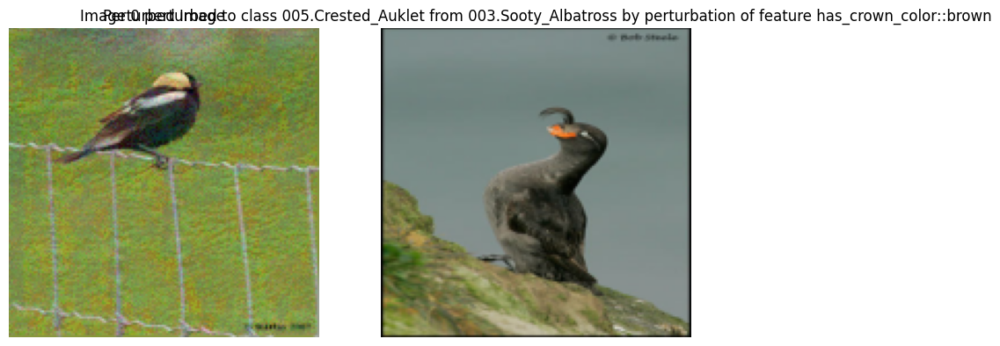

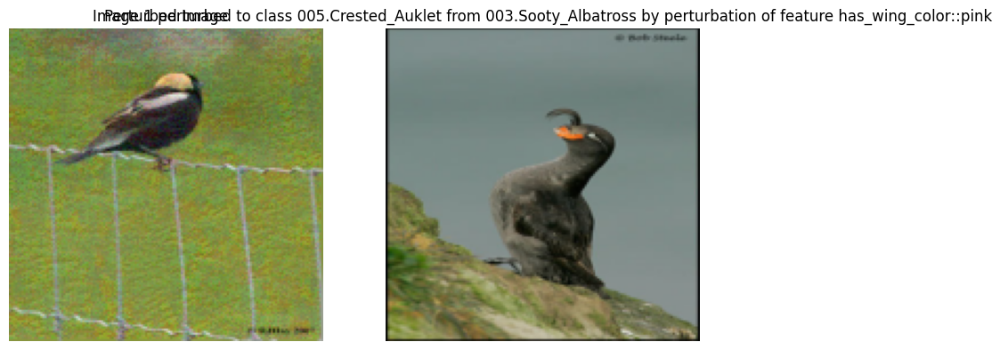

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


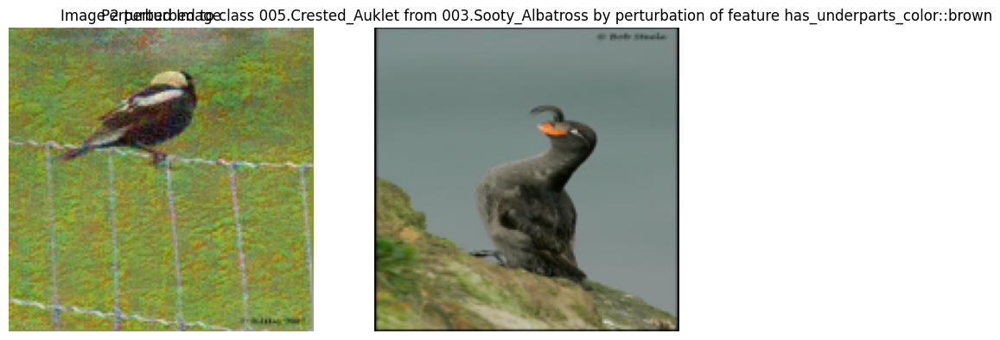

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


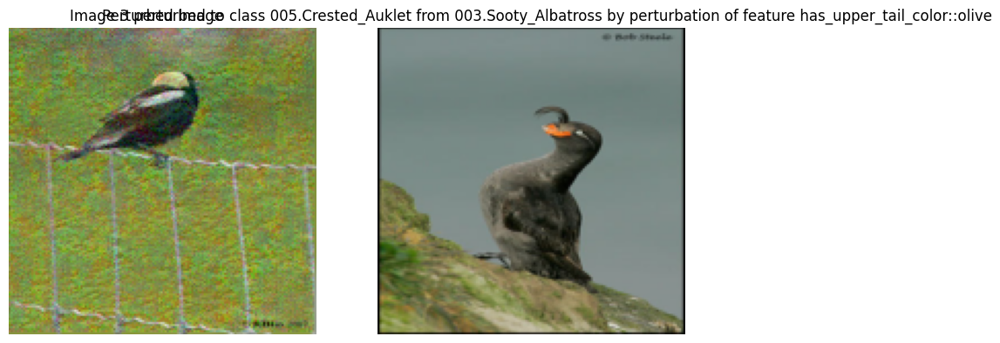

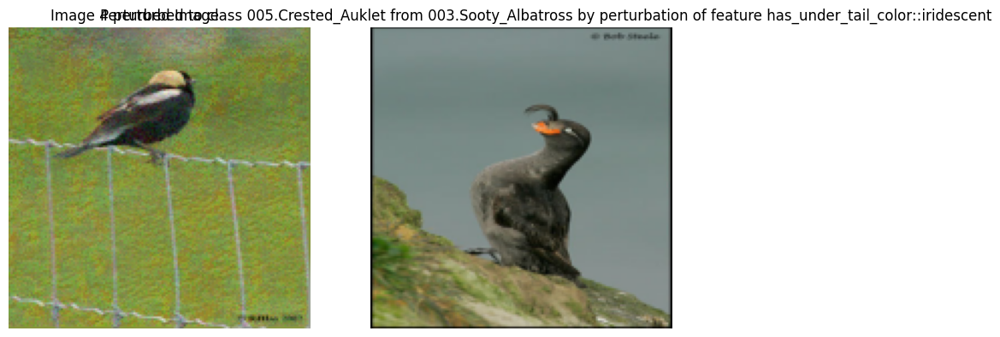

In [ ]:
# Iterate through each perturbed image
for index, image_set in enumerate(images_to_plot):
    perturbed_image = image_set[5]
    new_class = new_label

    max_ssim = -1
    most_similar_image = None
    minimum_feature_difference = math.inf
    # Iterate through all images in the new class
    for i in range(len(train_dataset)):
        image, _, label = train_dataset[i]
        if label == new_class:
            current_ssim = ssim(
                perturbed_image.squeeze().detach().cpu().numpy(),
                image.squeeze().detach().cpu().numpy(), 
                data_range=1.0,  # Assuming images are normalized between 0 and 1
                channel_axis=0  # Adjust this if your channel is on a different axis
            )
            if current_ssim > max_ssim:
                max_ssim = current_ssim
                most_similar_image = image
            # Check if the feature value of the image is close to the perturbed image
            # if cifar_encoder(image.unsqueeze(0)).squeeze()[feature] - perturbed_encoding[feature] < minimum_feature_difference:
            #     most_similar_image = image
            #     minimum_feature_difference = cifar_encoder(image.unsqueeze(0)).squeeze()[feature] - perturbed_encoding[feature]

    # Plot the perturbed image and the most similar image side by side
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
    axes[0].imshow(perturbed_image.detach().squeeze().permute(1, 2, 0).cpu().numpy())
    axes[0].axis('off')
    axes[0].set_title('Perturbed Image')

    axes[1].imshow(most_similar_image.permute(1, 2, 0).cpu().numpy())
    axes[1].axis('off')
    axes[1].set_title('Most Similar Image in New Class')
    plt.title(f"Image {index} perturbed to class {cub_all_class_names.iloc[new_label, 1]} from {cub_all_class_names.iloc[class_prediction.item(), 1]} by perturbation of feature {attribute_names[image_set[0]]}")

    plt.show()
